# Analyse


In [46]:
from pathlib import Path
import os
import time
import csv
import matplotlib.pyplot as plt
import numpy as np
import math
from matplotlib.patches import Rectangle
import seaborn as sns
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.stats import pearsonr
import random
import itertools
from scipy.stats import ttest_ind
from tabulate import tabulate
from collections import defaultdict
import re
import scikit_posthocs as sp
import tifffile


from imfcsoutputhandlerlib.all_image import AllImage
from imfcsoutputhandlerlib.getter import (
    get_total_num_cell,
    get_array_intensity,
    get_array_parameter_map,
    get_list_of_file_id,
    get_cfs_related,
    get_lagtimes,
)

Set input and output directories


In [ ]:
DIRNAME = "input/input_mef-dii-oa-batch"
DIRNAME_OUTPUT = "output/output_mef-dii-oa-batch"

PICKLE_DATABASE_FILENAME = "all-image-database_20251201_170033.pkl"

IS_SAVE_PLOT = True
IS_SAVE_CSV = True

In [3]:
current_dir = Path().resolve()
input_path = Path(os.path.join(current_dir.parent, DIRNAME))
output_path = Path(os.path.join(current_dir.parent, DIRNAME_OUTPUT))

Load database


In [ ]:
time_start = time.time()
all_image_instance = AllImage.from_pickle(
    Path(os.path.join(input_path, PICKLE_DATABASE_FILENAME))
)
time_elapsed = time.time() - time_start
print(f"time taken to load database: {time_elapsed:.3f} s")

Missing 'new_method'. Added default implementation.
time taken to load database: 1.184 s


In [5]:
all_image_instance.get_list_of_image()[0]

ImageInfo(key=tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW, associated_files=['tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW_AVR.tif', 'tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW_metadata.xlsx', 'tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW_pt1.xlsx'], rect_coordinates=None, is_roi_selected=None)

In [6]:
time_start = time.time()
array_average_intensity_all = get_array_intensity(all_image_instance)
array_parameter_map_all = get_array_parameter_map(all_image_instance)
list_basename_all = get_list_of_file_id(all_image_instance)
array_lagtimes = get_lagtimes(all_image_instance)
array_acf1 = get_cfs_related(all_image_instance, var="acf1")
array_sd1 = get_cfs_related(all_image_instance, var="sd1")
array_fit1 = get_cfs_related(all_image_instance, var="fit1")

time_elapsed = time.time() - time_start
print(f"time loading array from AllImage instance: {time_elapsed:.2f} s")

time loading array from AllImage instance: 2.63 s


In [7]:
print(f"Total number of cells: {get_total_num_cell(all_image_instance)}")
print(
    f"shape intensity single cell: {get_array_intensity(all_image_instance, 0).shape}"
)
print(f"shape intensity all cell: {array_average_intensity_all.shape}")
print(
    f"all key {len(get_list_of_file_id(all_image_instance))}: {get_list_of_file_id(all_image_instance)}"
)
print(f"get p map single cell: {get_array_parameter_map(all_image_instance, 0).shape}")
print(f"get pmap all cell: {array_parameter_map_all.shape}")
print(f"get acf1 all cell: {array_acf1.shape}")
print(f"get sd1 all cell: {array_sd1.shape}")
print(f"get fit1 all cell: {array_fit1.shape}")
print(f"get lagtimes all cell: {array_lagtimes.shape}")

Total number of cells: 136
shape intensity single cell: (40, 96, 96)
shape intensity all cell: (136, 40, 96, 96)
all key 136: ['tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW', 'tirfmh29_241017_03_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW', 'tirfmh29_241017_05_w1_cell2_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW', 'tirfmh29_241017_07_w1_cell3_CAV1-KO_DiI100nM-30min_p62_a63d20_561nm_283uW', 'tirfmh29_241017_08_w1_cell3_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW', 'tirfmh29_241017_10_w1_cell4_CAV1-KO_DiI100nM-30min_p62_a63d20_561nm_283uW', 'tirfmh29_241017_11_w1_cell4_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW', 'tirfmh29_241017_13_w1_cell5_CAV1-KO_DiI100nM-30min_p62_a63d20_561nm_283uW', 'tirfmh29_241017_15_w1_cell6_CAV1-KO_DiI100nM-30min_p62_a63d20_561nm_283uW', 'tirfmh29_241017_17_w2_cell1_CAV1-KO_DiI100nM-30min_p62_a63d20_2d4mMOA-19m_561nm_283uW', 'tirfmh29_241017_18_w2_cell1_CAV1-KO_DiI100nM-30min_p62_a63d20_2d4mMOA-25m_561nm_283uW', 't

Set threshold for reasonable diffusion coefficient and region for analysis


In [8]:
CENTRAL_FRACTION = 0.5
D_THRESHOLD = (0, 20)

Show TIRF images


In [9]:
def get_central_region(image, center_fraction=0.8):
    """
    Extracts the min-max range based on the central fraction of the image.

    Parameters:
    - image: 2D NumPy array
    - center_fraction: Fraction of the image (default is 30% or 0.3)

    Returns:
    - (min_value, max_value) for dynamic contrast scaling
    """

    assert len(image.shape) == 2, "input image must be 2D"

    h, w = image.shape
    ch, cw = int(h * center_fraction), int(w * center_fraction)  # Central region size
    y_start, x_start = (h - ch) // 2, (w - cw) // 2  # Start indices

    # Extract the central region
    central_region = image[y_start : y_start + ch, x_start : x_start + cw]

    return central_region


def get_central_region_multiple_image(images, center_fraction=0.8):
    """
    Extracts the min-max range based on the central fraction of the image.

    Parameters:
    - image: 3D NumPy array
    - center_fraction: Fraction of the image (default is 30% or 0.3)

    Returns:
    - cropped region, y_start (index start from 0), x_start (index start from 0)
    """
    assert len(images.shape) == 3, "input image must be 3D"

    n, h, w = images.shape
    ch, cw = int(h * center_fraction), int(w * center_fraction)  # Central region size
    y_start, x_start = (h - ch) // 2, (w - cw) // 2  # Start indices

    # Extract the central region
    central_region = images[:, y_start : y_start + ch, x_start : x_start + cw]

    return central_region, y_start, x_start

In [10]:
def plot_first_frames(array: np.array, list_basename: list[str]):

    num_files, n, w, h = array.shape

    if num_files == 0:
        print("No matching TIFF files found.")
        return

    # Initialize lists to store intensity values for each group
    intensities_group1 = []  # without 'OA' and with '283'
    intensities_group2 = []  # without 'OA' and with '588'
    intensities_group3 = []  # with 'OA' and with '283'
    intensities_group4 = []  # with 'OA' and with '588'

    # Determine the layout for subplots (e.g., 2x3 for 6 images)
    cols = math.ceil(math.sqrt(num_files))
    rows = math.ceil(num_files / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    axes = axes.flatten()  # Flatten in case of a 2D array of axes

    array_average_intensity_first_frame = np.zeros((num_files, w, h))

    x_roi, y_roi = get_central_region(
        array_average_intensity_first_frame[0], center_fraction=CENTRAL_FRACTION
    ).shape
    print(f"number of pixels: {x_roi * y_roi}, {x_roi=} {y_roi=}")

    for idx, file in enumerate(list_basename):

        # Read the first frame (assuming it's the first page in the TIFF file)
        array_average_intensity_first_frame[idx, :, :] = array[idx, 0, :, :]

        # Compute min and max values from the central region
        central_region = get_central_region(
            array_average_intensity_first_frame[idx], center_fraction=CENTRAL_FRACTION
        )  # Get dynamic range
        min_value, max_value = np.nanmin(central_region), np.nanmax(
            central_region
        )  # Handle NaNs

        # Plot the first frame
        ax = axes[idx]
        ax.imshow(
            array_average_intensity_first_frame[idx],
            cmap="gray",
            vmin=min_value,
            vmax=max_value,
        )
        ax.axis("off")

        # Check if 'OA' is in the filename and draw a red border if so
        if "OA" in file:
            # Add a red rectangle as a border
            rect = Rectangle(
                (0, 0),
                1,
                1,
                transform=ax.transAxes,
                linewidth=2.5,
                edgecolor="red",
                facecolor="none",
            )
            ax.add_patch(rect)

        # Extract central region
        central_region = get_central_region(
            array_average_intensity_first_frame[idx], center_fraction=CENTRAL_FRACTION
        )  # Get dynamic range

        # Calculate mean intensity of the central region
        mean_intensity = np.nanmean(central_region)

        # Categorize based on filename
        if "OA" in file:
            if "283" in file:
                intensities_group3.append(mean_intensity)
            elif "588" in file:
                intensities_group4.append(mean_intensity)
        else:
            if "283" in file:
                intensities_group1.append(mean_intensity)
            elif "588" in file:
                intensities_group2.append(mean_intensity)

    # Create corresponding group labels
    labels_group1 = ["-OA & 283uW"] * len(intensities_group1)
    labels_group2 = ["-OA & 588uW"] * len(intensities_group2)
    labels_group3 = ["+OA & 283uW"] * len(intensities_group3)
    labels_group4 = ["+OA & 588uW"] * len(intensities_group4)

    # Combine intensities and labels
    intensities = (
        intensities_group1
        + intensities_group2
        + intensities_group3
        + intensities_group4
    )
    labels = labels_group1 + labels_group2 + labels_group3 + labels_group4

    # Create a DataFrame
    df = pd.DataFrame({"Group": labels, "Intensity": intensities})

    # Perform pairwise t-tests
    pairwise_results = sp.posthoc_ttest(
        df, val_col="Intensity", group_col="Group", p_adjust="bonferroni"
    )
    print(f"pariwise t-test results: {pairwise_results}")

    # Hide any unused subplots
    for ax in axes[num_files:]:
        ax.axis("off")

    # Identify the highest intensity point in the last group
    last_group = "+OA & 588uW"
    second_group = "-OA & 588uW"

    max_intensity_last_group = df[df["Group"] == last_group]["Intensity"].max()
    max_point = df[
        (df["Group"] == last_group) & (df["Intensity"] == max_intensity_last_group)
    ]

    # Extract all points from the second group
    second_group_points = df[df["Group"] == second_group]

    np.random.seed(42)  # Replace 42 with any integer of your choice
    plt.figure(figsize=(6, 6))
    sns.boxplot(x="Group", y="Intensity", data=df, showfliers=False)
    sns.stripplot(x="Group", y="Intensity", data=df, color="black", jitter=0.2, size=3)

    is_draw_conecting_line = True
    if is_draw_conecting_line:
        # Draw lines connecting the max point in the last group to all points in the second group
        for _, point in second_group_points.iterrows():
            plt.plot(
                [
                    df["Group"].unique().tolist().index(last_group),
                    df["Group"].unique().tolist().index(second_group),
                ],
                [max_point["Intensity"].values[0], point["Intensity"]],
                color="grey",
                linestyle="-",
                linewidth=0.5,
            )

    plt.title(
        f"Intensity Comparison of Central {CENTRAL_FRACTION*100:.0f}% Region by Group"
    )
    plt.ylabel("Mean Intensity")

    plt.tight_layout()
    plt.show()

number of pixels: 2304, x_roi=48 y_roi=48
pariwise t-test results:              -OA & 283uW  -OA & 588uW  +OA & 283uW  +OA & 588uW
-OA & 283uW          1.0          1.0          1.0          1.0
-OA & 588uW          1.0          1.0          1.0          1.0
+OA & 283uW          1.0          1.0          1.0          1.0
+OA & 588uW          1.0          1.0          1.0          1.0


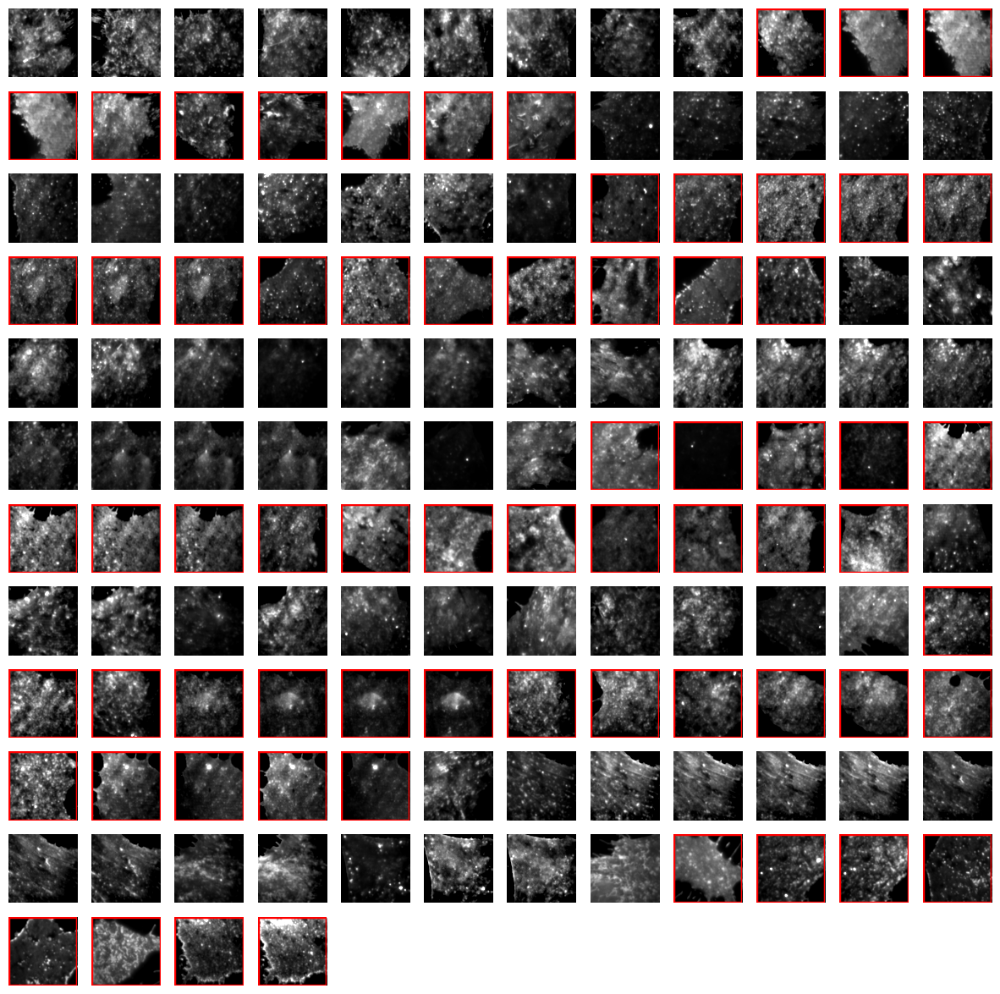

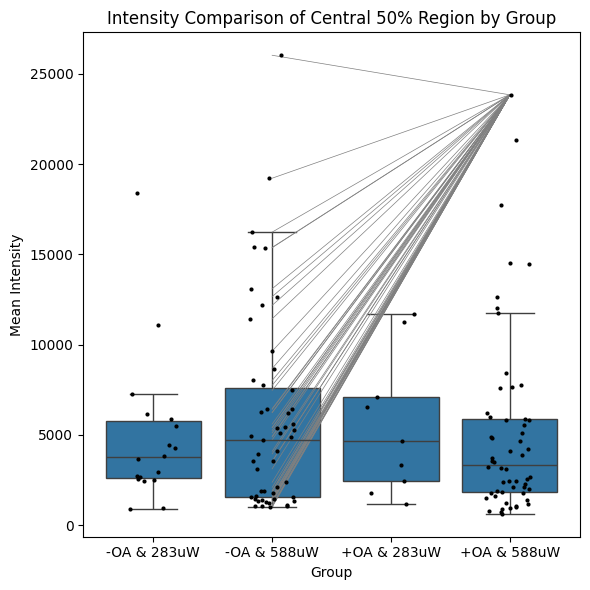

In [11]:
plot_first_frames(array=array_average_intensity_all, list_basename=list_basename_all)

Show D map


In [12]:
def plot_d_values(
    param_array: np.array,
    list_basename: list[str],
    mode: int,
    PARAM=None,
    title_suffix: str = None,
    central_fraction: float = 0.8,
):
    """
    Reads all parameter array storing all 15x parameter map for each cell and compare diffusion values
    """

    num_files, w, h = param_array.shape

    # Initialize lists to store diffusion values for each group
    param_group1 = []  # without 'OA' and with '283'
    param_group2 = []  # without 'OA' and with '588'
    param_group3 = []  # with 'OA' and with '283'
    param_group4 = []  # with 'OA' and with '588'

    # Determine the layout for subplots (e.g., 2x3 for 6 images)
    cols = math.ceil(math.sqrt(num_files))
    rows = math.ceil(num_files / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    axes = axes.flatten()  # Flatten in case of a 2D array of axes

    for idx, file in enumerate(list_basename):

        p_map = param_array[idx, :, :]

        # Extract central region
        central_region = get_central_region(
            p_map, center_fraction=central_fraction
        )  # Get dynamic range
        min_value, max_value = np.nanmin(central_region), np.nanmax(
            central_region
        )  # Handle NaNs

        # Plot parameter map
        ax = axes[idx]
        ax.imshow(p_map, cmap="inferno", vmin=min_value, vmax=max_value)
        ax.axis("off")

        # Check if 'OA' is in the filename and draw a red border if so
        if "OA" in file:
            # Add a red rectangle as a border
            rect = Rectangle(
                (0, 0),
                1,
                1,
                transform=ax.transAxes,
                linewidth=2.5,
                edgecolor="red",
                facecolor="none",
            )
            ax.add_patch(rect)

        # Calculate mean paremeter of the central region
        mean_parameter = np.nanmean(central_region)

        # Categorize based on filename
        if "OA" in file:
            if "283" in file:
                param_group3.append(mean_parameter)
            elif "588" in file:
                param_group4.append(mean_parameter)
        else:
            if "283" in file:
                param_group1.append(mean_parameter)
            elif "588" in file:
                param_group2.append(mean_parameter)

    # Create corresponding group labels
    labels_group1 = ["-OA & 283uW"] * len(param_group1)
    labels_group2 = ["-OA & 588uW"] * len(param_group2)
    labels_group3 = ["+OA & 283uW"] * len(param_group3)
    labels_group4 = ["+OA & 588uW"] * len(param_group4)

    # Combine param and labels
    param = param_group1 + param_group2 + param_group3 + param_group4
    labels = labels_group1 + labels_group2 + labels_group3 + labels_group4

    # Create a DPARAM
    df = pd.DataFrame({"Group": labels, PARAM: param})

    # Perform pairwise t-tests
    pairwise_results = sp.posthoc_ttest(
        df, val_col=PARAM, group_col="Group", p_adjust="bonferroni"
    )
    print(f"pariwise t-test results: {pairwise_results}")

    # Hide any unused subplots
    for ax in axes[num_files:]:
        ax.axis("off")

    # Identify the highest intensity point in the last group
    last_group = "+OA & 588uW"
    second_group = "-OA & 588uW"

    max_param_last_group = df[df["Group"] == last_group][PARAM].max()
    max_point = df[(df["Group"] == last_group) & (df[PARAM] == max_param_last_group)]

    # Extract all points from the second group
    second_group_points = df[df["Group"] == second_group]

    np.random.seed(42)  # Replace 42 with any integer of your choice
    plt.figure(figsize=(6, 6))
    sns.boxplot(x="Group", y=PARAM, data=df, showfliers=False)
    sns.stripplot(x="Group", y=PARAM, data=df, color="black", jitter=0.2, size=4)

    is_draw_conecting_line = False
    if is_draw_conecting_line:
        # Draw lines connecting the max point in the last group to all points in the second group
        for _, point in second_group_points.iterrows():
            plt.plot(
                [
                    df["Group"].unique().tolist().index(last_group),
                    df["Group"].unique().tolist().index(second_group),
                ],
                [max_point[param].values[0], point[param]],
                color="grey",
                linestyle="-",
                linewidth=0.5,
            )

    plt.title(
        f"{PARAM} \n Comparison of Central {CENTRAL_FRACTION * 100:.0f}% Region by Group \n {title_suffix}"
    )
    plt.ylabel(f"Mean {PARAM}")
    # plt.ylim(0, 40)
    plt.yscale("log")

    plt.tight_layout()
    plt.show()


def get_p_map(
    param_array: np.array, d_threshold: tuple = None, idx_param: int = 2, mode: int = 0
):

    # mode = 0 -> no thresholding
    # mode = 1 -> D thresholding

    # idx_param = 2, I am reading diffusion values, index 1 corresponds to D values

    num_files, w, h, p = param_array.shape
    print(
        f"Number of files: {num_files}, width: {w}, height: {h}, number of parameters: {p}"
    )  # diffusion is of index p = 2
    print(f"shape {param_array.shape}")

    p_map = param_array[:, :, :, idx_param]
    print(f"shape {p_map.shape}")

    match mode:
        case 0:
            return p_map
        case 1:
            assert d_threshold is not None, "missing d_threshold argument"
            p_map_d_thres = np.where(
                (p_map < d_threshold[0]) | (p_map > d_threshold[1]), np.nan, p_map
            )
            return p_map_d_thres

Number of files: 136, width: 96, height: 96, number of parameters: 15
shape (136, 96, 96, 15)
shape (136, 96, 96)
pariwise t-test results:              -OA & 283uW  -OA & 588uW  +OA & 283uW  +OA & 588uW
-OA & 283uW     1.000000     0.245254     0.188913     0.763803
-OA & 588uW     0.245254     1.000000     0.002353     0.092316
+OA & 283uW     0.188913     0.002353     1.000000     1.000000
+OA & 588uW     0.763803     0.092316     1.000000     1.000000


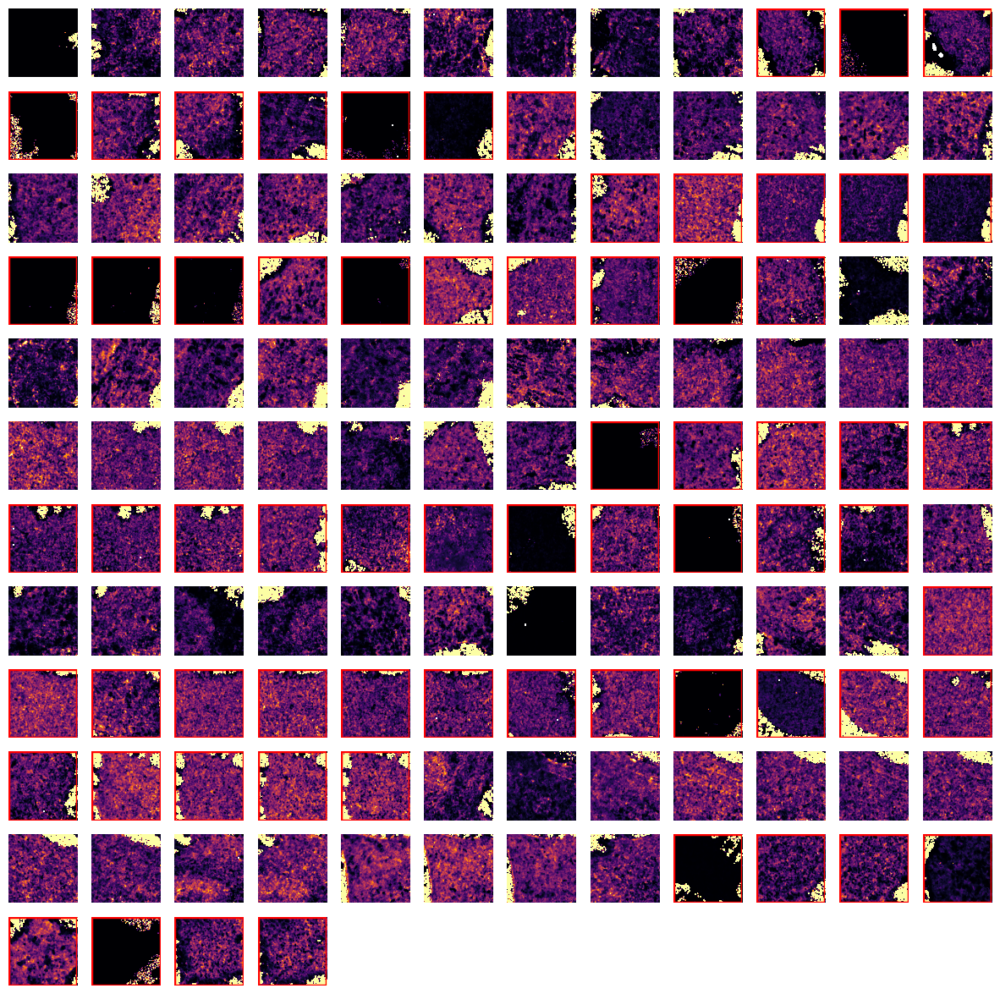

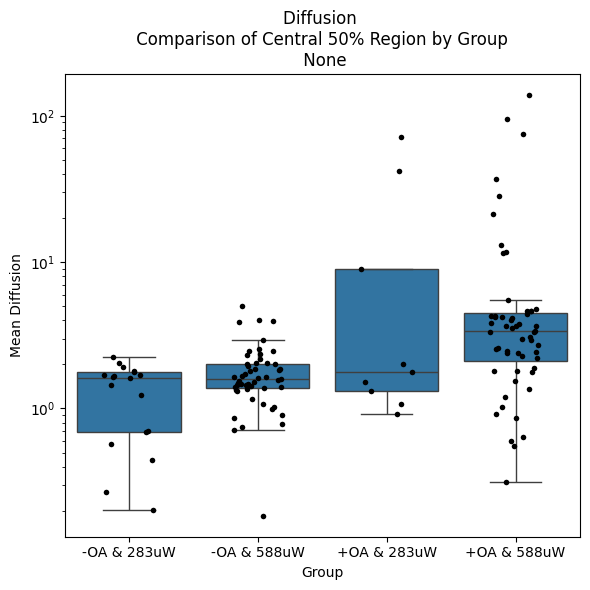

In [13]:
plt.close("all")
%matplotlib inline

diffusion_maps = get_p_map(param_array=array_parameter_map_all, mode=0, idx_param=2)

plot_d_values(param_array=diffusion_maps, list_basename=list_basename_all, mode=0, PARAM="Diffusion", central_fraction=CENTRAL_FRACTION)

Number of files: 136, width: 96, height: 96, number of parameters: 15
shape (136, 96, 96, 15)
shape (136, 96, 96)
pariwise t-test results:              -OA & 283uW  -OA & 588uW  +OA & 283uW  +OA & 588uW
-OA & 283uW     1.000000     0.144061     1.000000     0.000044
-OA & 588uW     0.144061     1.000000     0.722512     0.000021
+OA & 283uW     1.000000     0.722512     1.000000     0.007123
+OA & 588uW     0.000044     0.000021     0.007123     1.000000


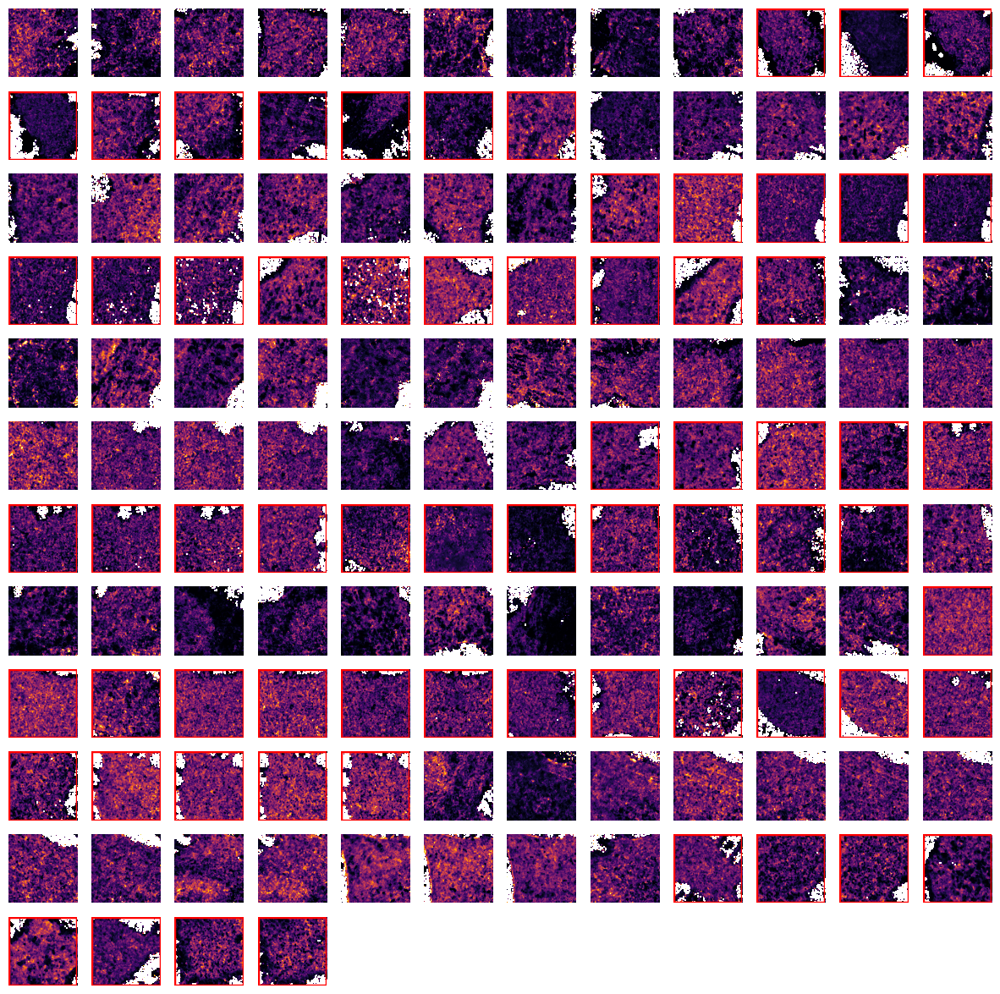

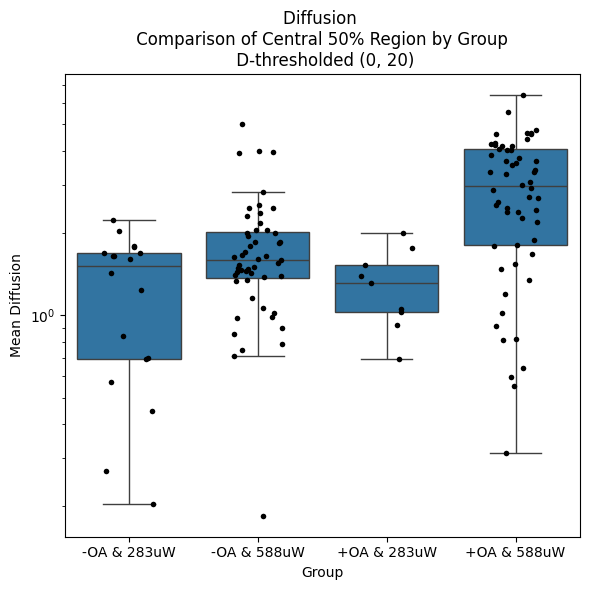

In [14]:
diffusion_maps_thres = get_p_map(
    param_array=array_parameter_map_all, mode=1, idx_param=2, d_threshold=D_THRESHOLD
)

plot_d_values(
    param_array=diffusion_maps_thres,
    list_basename=list_basename_all,
    mode=1,
    PARAM="Diffusion",
    title_suffix=f"D-thresholded {D_THRESHOLD}",
    central_fraction=CENTRAL_FRACTION,
)

In [15]:
def plot_paired_comparison_with_boxplot(data, group_labels=None, title=None):
    """
    Function to create a subplot with a paired dataset comparison.

    Parameters:
    - data: numpy array of shape (2, N) where:
        - data[0] contains "before" values
        - data[1] contains "after" values
    - group_labels: list of labels for the pairs (optional)
    """

    before_color = "#009E73"
    after_color = "#E69F00"

    num_pairs = data.shape[1]

    if group_labels is None:
        group_labels = [f"Pair {i+1}" for i in range(num_pairs)]

    x_positions = np.arange(num_pairs)

    # Create subplots (1 row, 2 columns)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # First subplot: Scatter plot with connecting lines
    axes[0].scatter(
        x_positions, data[0], color=before_color, label="Before", zorder=2, s=20
    )
    axes[0].scatter(
        x_positions, data[1], color=after_color, label="After", zorder=2, s=20
    )

    for i in range(num_pairs):
        axes[0].plot(
            [x_positions[i], x_positions[i]],
            [data[0, i], data[1, i]],
            color="gray",
            linestyle="--",
            alpha=0.7,
        )

    axes[0].set_xticks(x_positions)
    axes[0].set_xticklabels(group_labels, rotation=30)
    axes[0].set_ylabel("Diffusion constant")
    axes[0].set_title(f"Paired before and after {title}")
    axes[0].legend()
    axes[0].grid(True, linestyle="--", alpha=0.3)
    axes[0].set_yscale("log")

    # Second subplot: Box plot with mean and median
    box_data = [data[0], data[1]]
    box_colors = [before_color, after_color]

    boxplot = axes[1].boxplot(
        box_data,
        labels=["Before", "After"],
        patch_artist=True,
        boxprops=dict(color="black"),
        capprops=dict(color="black"),
        whiskerprops=dict(color="black"),
        medianprops=dict(color="black"),
    )  # Border color  # Whisker cap color  # Whisker color  # Median line color

    # Set box colors manually
    for patch, color in zip(boxplot["boxes"], box_colors):
        patch.set_facecolor(color)

    # Overlay mean and median points
    for i, d in enumerate(box_data, start=1):
        mean = np.mean(d)
        median = np.median(d)
        axes[1].scatter(
            i, mean, color="black", marker="o", label="Mean" if i == 1 else "", zorder=3
        )

    axes[1].set_title(f"Grouped before and after {title}")
    axes[1].set_ylabel("Diffusion coefficient")
    axes[1].legend()
    axes[1].set_yscale("log")

    plt.tight_layout()
    plt.show()

Compare D vs I


(96, 96)
(96, 96)
Pearson Correlation: 0.1046, p-value: 4.877e-07


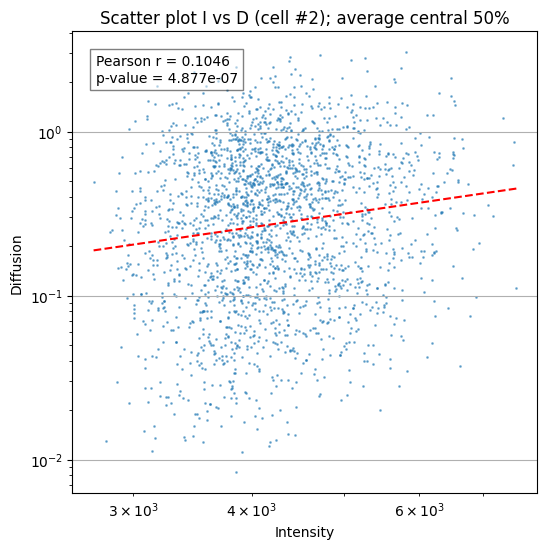

In [16]:
def scatter_plot_arrays_2D(
    array1: np.array,
    array2: np.array,
    central_fraction: float,
    title: str = "Scatter plot I vs D",
    x_label: str = "Intensity",
    y_label: str = "Diffusion",
):
    """
    Creates a scatter plot between two NumPy arrays of the same shape.

    Parameters:
        array1 (numpy.ndarray): First NumPy array of shape (136, 96, 96)
        array2 (numpy.ndarray): Second NumPy array of shape (136, 96, 96)

    Returns:
        None (Displays scatter plot)
    """
    print(array1.shape)
    print(array2.shape)
    # Ensure both arrays have the same shape
    if array1.shape != array2.shape:
        raise ValueError("Both arrays must have the same shape.")

    # Flatten the arrays into 1D
    flatten_array1 = get_central_region(
        array1, center_fraction=central_fraction
    ).flatten()
    flatten_array2 = get_central_region(
        array2, center_fraction=central_fraction
    ).flatten()

    # Create a mask for non-NaN values in both arrays
    valid_mask = ~np.isnan(flatten_array1) & ~np.isnan(flatten_array2)

    # Apply mask to remove NaN values
    filtered_array1 = flatten_array1[valid_mask]
    filtered_array2 = flatten_array2[valid_mask]

    # Compute Pearson correlation coefficient and p-value
    correlation, p_value = pearsonr(filtered_array1, filtered_array2)
    print(f"Pearson Correlation: {correlation:.4f}, p-value: {p_value:.4g}")

    # Create scatter plot
    plt.figure(figsize=(6, 6))
    plt.scatter(
        filtered_array1, filtered_array2, alpha=0.5, s=1
    )  # Use small dots for better visualization

    # Plot Pearson regression line
    coeffs = np.polyfit(np.log10(filtered_array1), np.log10(filtered_array2), 1)
    poly_eq = np.poly1d(coeffs)
    x_vals = np.linspace(min(filtered_array1), max(filtered_array1), 100)
    y_vals = 10 ** poly_eq(np.log10(x_vals))

    plt.plot(x_vals, y_vals, color="red", linestyle="--", label="Pearson Fit Line")

    # Add Pearson correlation coefficient as a text box in the plot
    text_str = f"Pearson r = {correlation:.4f}\np-value = {p_value:.4g}"
    plt.text(
        0.05,
        0.95,
        text_str,
        transform=plt.gca().transAxes,
        fontsize=10,
        verticalalignment="top",
        bbox=dict(facecolor="white", alpha=0.5, edgecolor="black"),
    )

    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.grid(True)
    plt.yscale("log")
    plt.xscale("log")
    plt.show()


cell_idx = 1
scatter_plot_arrays_2D(
    array1=array_average_intensity_all[cell_idx, 0, :, :],
    array2=array_parameter_map_all[cell_idx, :, :, 2],
    central_fraction=CENTRAL_FRACTION,
    title=f"Scatter plot I vs D (cell #{cell_idx + 1}); average central {CENTRAL_FRACTION * 100:.0f}%",
)

In [17]:
def plot_scatter_i_d_all_cell(
    array1, array2, list_basename: list[str], central_fraction
):

    PARAM_R = "Pearson r"
    PARAM_P = "P-value"

    # Ensure both arrays have the same shape
    if array1.shape != array2.shape:
        raise ValueError("Both arrays must have the same shape.")

    num_files = array1.shape[0]  # Number of 2D slices (files)

    # Determine the layout for subplots (e.g., 2x3 for 6 images)
    cols = math.ceil(math.sqrt(num_files))
    rows = math.ceil(num_files / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(18, 18))
    axes = axes.flatten()  # Flatten in case of a 2D array of axes

    # Initialize lists to store Pearson r and p-values for each group
    param_r_group1, param_p_group1 = [], []  # without 'OA' and with '283'
    param_r_group2, param_p_group2 = [], []  # without 'OA' and with '588'
    param_r_group3, param_p_group3 = [], []  # with 'OA' and with '283'
    param_r_group4, param_p_group4 = [], []  # with 'OA' and with '588'

    for idx, file in enumerate(list_basename):

        ax = axes[idx]

        # Extract and flatten the central region
        flatten_array1 = get_central_region(
            array1[idx], center_fraction=central_fraction
        ).flatten()
        flatten_array2 = get_central_region(
            array2[idx], center_fraction=central_fraction
        ).flatten()

        # Create a mask for non-NaN values in both arrays
        valid_mask = ~np.isnan(flatten_array1) & ~np.isnan(flatten_array2)

        # Apply mask to remove NaN values
        filtered_array1 = flatten_array1[valid_mask]
        filtered_array2 = flatten_array2[valid_mask]

        # Compute Pearson correlation coefficient and p-value
        correlation, p_value = pearsonr(filtered_array1, filtered_array2)

        # Scatter plot
        ax.scatter(filtered_array1, filtered_array2, alpha=0.5, s=1)

        # Pearson regression line
        coeffs = np.polyfit(np.log10(filtered_array1), np.log10(filtered_array2), 1)
        poly_eq = np.poly1d(coeffs)
        x_vals = np.linspace(min(filtered_array1), max(filtered_array1), 100)
        y_vals = 10 ** poly_eq(np.log10(x_vals))

        ax.plot(x_vals, y_vals, color="red", linestyle="--", label="Pearson Fit")

        # Add Pearson r and p-value text
        text_str = f"r={correlation:.2f}\np={p_value:.2g}"
        ax.text(
            0.05,
            0.95,
            text_str,
            transform=ax.transAxes,
            fontsize=8,
            verticalalignment="top",
            bbox=dict(facecolor="white", alpha=0.5),
        )

        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.grid(True)
        ax.set_title(f"Cell {idx+1}")
        ax.axis("off")

        # Check if 'OA' is in the filename and draw a red border if so
        if "OA" in file:
            # Add a red rectangle as a border
            rect = Rectangle(
                (0, 0),
                1,
                1,
                transform=ax.transAxes,
                linewidth=2.5,
                edgecolor="red",
                facecolor="none",
            )
            ax.add_patch(rect)

        # Categorize based on filename
        if "OA" in file:
            if "283" in file:
                param_r_group3.append(correlation)
                param_p_group3.append(p_value)
            elif "588" in file:
                param_r_group4.append(correlation)
                param_p_group4.append(p_value)
        else:
            if "283" in file:
                param_r_group1.append(correlation)
                param_p_group1.append(p_value)
            elif "588" in file:
                param_r_group2.append(correlation)
                param_p_group2.append(p_value)

    # Create corresponding group labels
    labels_group1 = ["-OA & 283uW"] * len(param_r_group1)
    labels_group2 = ["-OA & 588uW"] * len(param_r_group2)
    labels_group3 = ["+OA & 283uW"] * len(param_r_group3)
    labels_group4 = ["+OA & 588uW"] * len(param_r_group4)

    # Combine param and labels
    param_r = param_r_group1 + param_r_group2 + param_r_group3 + param_r_group4
    param_p = param_p_group1 + param_p_group2 + param_p_group3 + param_p_group4
    labels = labels_group1 + labels_group2 + labels_group3 + labels_group4

    # Create a DPARAM
    df = pd.DataFrame({"Group": labels, PARAM_R: param_r, PARAM_P: param_p})

    # Melt the DataFrame for side-by-side boxplots
    df_melted = df.melt(
        id_vars=["Group"],
        value_vars=[PARAM_R, PARAM_P],
        var_name="Type",
        value_name="Value",
    )

    # Hide any unused subplots
    for ax in axes[num_files:]:
        ax.axis("off")

    np.random.seed(42)  # Replace 42 with any integer of your choice
    plt.figure(figsize=(7, 7))

    sns.boxplot(
        x="Group",
        y="Value",
        hue="Type",
        data=df_melted,
        showfliers=False,
        palette={"Pearson r": "lightblue", "P-value": "lightcoral"},
    )
    sns.stripplot(
        x="Group",
        y="Value",
        hue="Type",
        data=df_melted,
        dodge=True,
        jitter=0.2,
        size=3,
        color="black",
    )

    plt.title(
        f"Comparison of {PARAM_R} and {PARAM_P} by Group (Central {central_fraction*100:.0f}% Region)"
    )
    plt.ylabel(f"Value (Pearson r / P-value)")
    plt.legend(title="")
    plt.tight_layout()
    plt.show()

/var/folders/_j/d7rxzvrs6snf8dky44r4_6mr0000gn/T/ipykernel_53724/706164968.py:145: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(


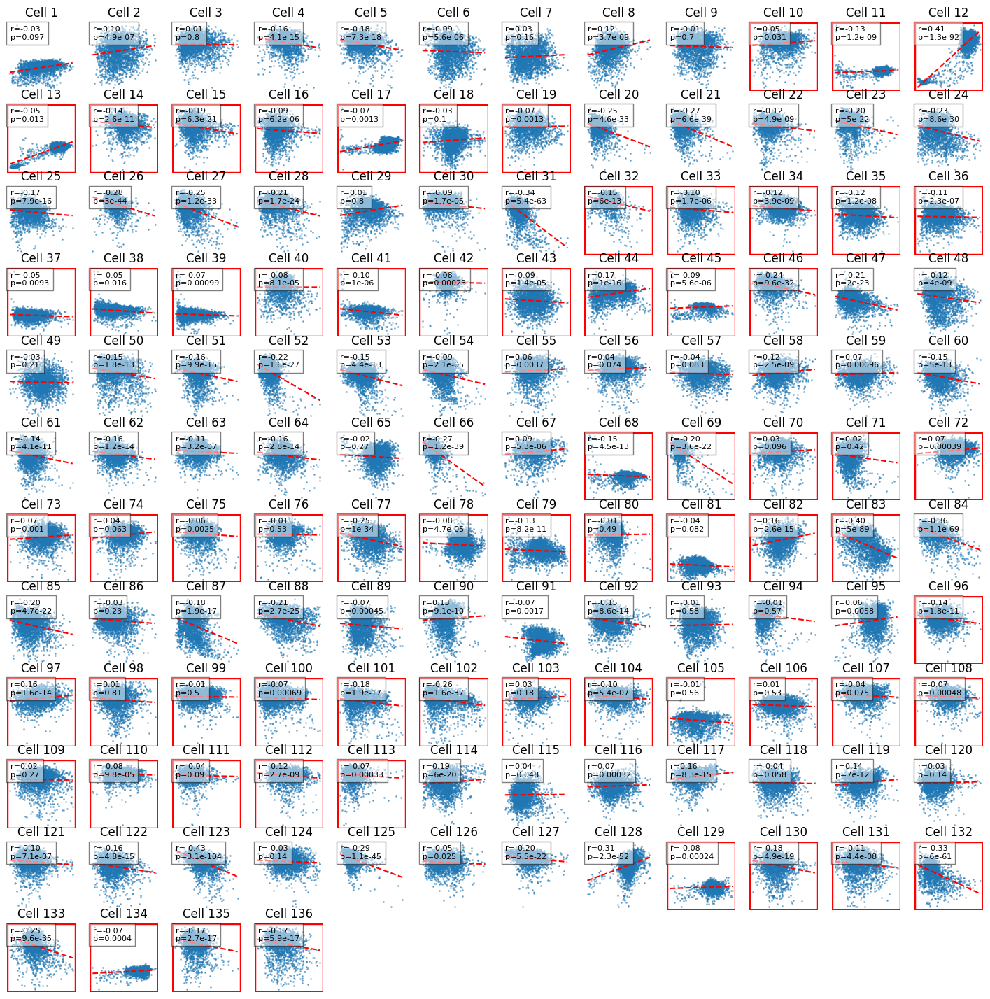

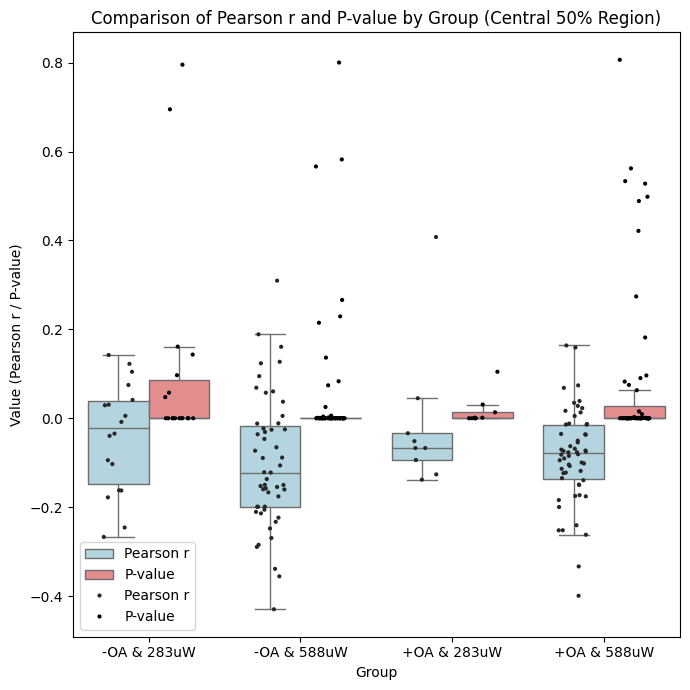

In [18]:
plot_scatter_i_d_all_cell(
    array1=array_average_intensity_all[:, 0, :, :],
    array2=array_parameter_map_all[:, :, :, 2],
    list_basename=list_basename_all,
    central_fraction=CENTRAL_FRACTION,
)

In [19]:
def scatter_plot_arrays_3D(
    array1: np.ndarray,
    array2: np.ndarray,
    central_fraction: float,
    title: str = "Scatter plot I vs D",
    x_label: str = "Intensity",
    y_label: str = "Diffusion",
):
    """
    Creates a scatter plot between two 3D NumPy arrays using the mean of the central region.

    Parameters:
        array1 (numpy.ndarray): First 3D NumPy array of shape (136, 96, 96).
        array2 (numpy.ndarray): Second 3D NumPy array of shape (136, 96, 96).
        central_fraction (float): Fraction of the central region to consider for averaging.
        title (str): Title of the scatter plot.
        x_label (str): Label for the x-axis.
        y_label (str): Label for the y-axis.

    Returns:
        None (Displays scatter plot)
    """
    # Ensure both arrays have the same shape
    if array1.shape != array2.shape:
        raise ValueError("Both arrays must have the same shape.")

    n, w, h = array1.shape
    combined_array = np.stack((array1, array2), axis=0)
    combined_average = np.empty((2, n))

    print(f"total number of cell: {n}")

    # extract central region for each parameter and file
    for i in range(n):
        for j in range(2):
            # Extract central region
            central_region = get_central_region(
                combined_array[j, i, :, :], center_fraction=CENTRAL_FRACTION
            )  # Get dynamic range

            # Calculate mean paremeter of the central region
            combined_average[j, i] = np.nanmean(central_region)

    # Compute Pearson correlation coefficient and p-value
    correlation, p_value = pearsonr(combined_average[0, :], combined_average[1, :])
    print(f"Pearson Correlation: {correlation:.4f}, p-value: {p_value:.4g}")

    # Create scatter plot
    plt.figure(figsize=(6, 6))
    plt.scatter(
        combined_average[0, :], combined_average[1, :], alpha=0.5, s=10
    )  # Larger dots for better visibility

    # Plot Pearson regression line
    coeffs = np.polyfit(
        np.log10(combined_average[0, :]), np.log10(combined_average[1, :]), 1
    )
    poly_eq = np.poly1d(coeffs)
    x_vals = np.linspace(min(combined_average[0, :]), max(combined_average[0, :]), 100)
    y_vals = 10 ** poly_eq(np.log10(x_vals))

    plt.plot(x_vals, y_vals, color="red", linestyle="--", label="Pearson Fit Line")

    # Add Pearson correlation coefficient as a text box in the plot
    text_str = f"Pearson r = {correlation:.4f}\np-value = {p_value:.4g}"
    plt.text(
        0.05,
        0.15,
        text_str,
        transform=plt.gca().transAxes,
        fontsize=10,
        verticalalignment="top",
        bbox=dict(facecolor="white", alpha=0.5, edgecolor="black"),
    )

    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.grid(True)
    plt.yscale("log")
    plt.xscale("log")
    plt.show()

total number of cell: 136
Pearson Correlation: -0.0796, p-value: 0.3567


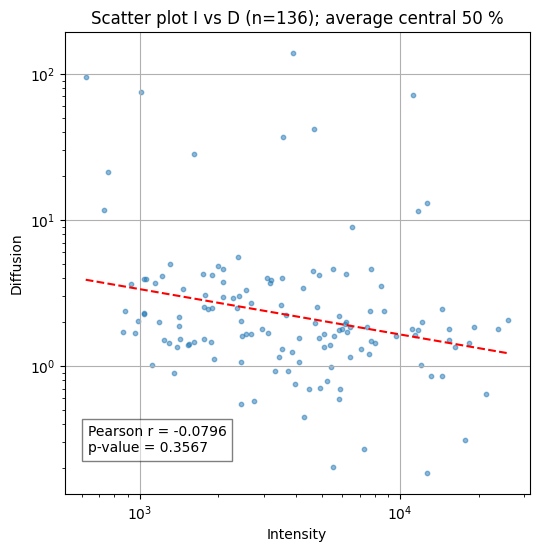

In [20]:
scatter_plot_arrays_3D(
    array1=array_average_intensity_all[:, 0, :, :],
    array2=array_parameter_map_all[:, :, :, 2],
    central_fraction=CENTRAL_FRACTION,
    title=f"Scatter plot I vs D (n={array_average_intensity_all.shape[0]}); average central {CENTRAL_FRACTION * 100:.0f} %",
)

In [21]:
def scatter_plot_arrays_3D(
    list_basename: list[str],
    array1: np.ndarray,
    array2: np.ndarray,
    central_fraction: float,
    title: str = "Scatter plot I vs D",
    x_label: str = "Intensity",
    y_label: str = "Diffusion",
    scale_factor=10**12,
) -> list:
    """
    Creates a scatter plot between two 3D NumPy arrays using the mean of the central region.
    Includes K-Means clustering to group similar data points.

    Parameters:
        array1 (numpy.ndarray): First 3D NumPy array of shape (136, 96, 96).
        array2 (numpy.ndarray): Second 3D NumPy array of shape (136, 96, 96).
        central_fraction (float): Fraction of the central region to consider for averaging.
        title (str): Title of the scatter plot.
        x_label (str): Label for the x-axis.
        y_label (str): Label for the y-axis.

    Returns:
        None (Displays scatter plot with K-Means clusters)
    """

    # Ensure both arrays have the same shape
    if array1.shape != array2.shape:
        raise ValueError("Both arrays must have the same shape.")

    n, w, h = array1.shape
    combined_array = np.stack((array1, array2 * scale_factor), axis=0)
    combined_average = np.empty((2, n))

    print(f"Total number of cells: {n}")

    # Extract central region for each parameter and file
    for i in range(n):
        for j in range(2):
            # Extract central region
            central_region = get_central_region(
                combined_array[j, i, :, :], center_fraction=central_fraction
            )
            # Calculate mean parameter of the central region
            combined_average[j, i] = np.nanmean(central_region)

    # Compute Pearson correlation coefficient and p-value
    correlation, p_value = pearsonr(combined_average[0, :], combined_average[1, :])
    print(f"Pearson Correlation: {correlation:.4f}, p-value: {p_value:.4g}")

    # Convert to 2D array for clustering
    data_points = np.column_stack((combined_average[0, :], combined_average[1, :]))

    # Find the Optimal Number of Clusters using the Elbow Method
    distortions = []
    silhouette_scores = []
    K_range = range(2, 6)  # Trying k values from 2 to 5

    for k in K_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data_points)
        distortions.append(kmeans.inertia_)  # Sum of squared distances
        silhouette_scores.append(silhouette_score(data_points, labels))

    # Choose the best `k` using silhouette score
    best_k = K_range[np.argmax(silhouette_scores)]
    print(f"Optimal number of clusters (k): {best_k}")

    # Apply K-Means with the optimal k
    kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(data_points)

    # Find and Print Indices of Points in Cluster 1
    clust_idx = 0
    cluster_one_indices = np.where(cluster_labels == clust_idx)[0]

    # Find and Print Indices of Points in Cluster 2 (Potential Outliers)
    clust_idx = 1  # Get indices of points in cluster 2
    outlier_indices = np.where(cluster_labels == clust_idx)[0]
    print(np.where(cluster_labels == clust_idx))
    print(f"Outlier Indices (Cluster {clust_idx + 1}): {outlier_indices}")

    # Scatter plot with K-Means cluster labels
    plt.figure(figsize=(6, 6))
    plt.scatter(
        combined_average[0, :],
        combined_average[1, :] / scale_factor,
        c=cluster_labels,
        cmap="rainbow",
        alpha=0.6,
        s=10,
    )

    # Plot cluster centroids
    plt.scatter(
        kmeans.cluster_centers_[:, 0],
        kmeans.cluster_centers_[:, 1] / scale_factor,
        c="red",
        marker="X",
        s=50,
        label="Centroids",
    )

    # Plot Pearson regression line
    coeffs = np.polyfit(
        np.log10(combined_average[0, :]), np.log10(combined_average[1, :]), 1
    )
    poly_eq = np.poly1d(coeffs)
    x_vals = np.linspace(min(combined_average[0, :]), max(combined_average[0, :]), 100)
    y_vals = 10 ** poly_eq(np.log10(x_vals)) / scale_factor

    plt.plot(x_vals, y_vals, color="black", linestyle="--", label="Pearson Fit Line")

    # Add Pearson correlation coefficient as a text box in the plot
    text_str = (
        f"Pearson r = {correlation:.4f}\np-value = {p_value:.4g}\nBest k = {best_k}"
    )
    plt.text(
        0.05,
        0.15,
        text_str,
        transform=plt.gca().transAxes,
        fontsize=10,
        verticalalignment="top",
        bbox=dict(facecolor="white", alpha=0.5, edgecolor="black"),
    )

    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.grid(True)
    plt.yscale("log")
    plt.xscale("log")
    plt.legend()
    plt.show()

    return cluster_one_indices, outlier_indices

Total number of cells: 136
Pearson Correlation: -0.0796, p-value: 0.3567
Optimal number of clusters (k): 2
(array([10, 38, 40, 67]),)
Outlier Indices (Cluster 2): [10 38 40 67]


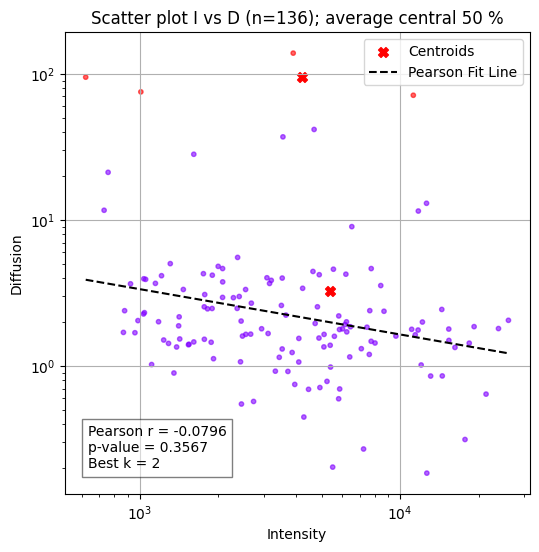

printing outliers according to K-means:
Index 10: tirfmh29_241017_18_w2_cell1_CAV1-KO_DiI100nM-30min_p62_a63d20_2d4mMOA-25m_561nm_283uW
Index 38: tirfmh29_241018_39_w3_cell2_WT_DiI100nM-30min_p62_561nm_588uW_2d4mMOA-120m
Index 40: tirfmh29_241018_43_w3_cell4_WT_DiI100nM-30min_p62_561nm_588uW_2d4mMOA-150m
Index 67: tirfmh29_241022_42_w3_cell1_WT_DiI200nM-30min_p62_a63d20_561nm_588uW_2d4mMOA-25min-on-stage
printing non outliers according to K-means:
Index 0: tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW
Index 1: tirfmh29_241017_03_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW
Index 2: tirfmh29_241017_05_w1_cell2_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW
Index 3: tirfmh29_241017_07_w1_cell3_CAV1-KO_DiI100nM-30min_p62_a63d20_561nm_283uW
Index 4: tirfmh29_241017_08_w1_cell3_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW
Index 5: tirfmh29_241017_10_w1_cell4_CAV1-KO_DiI100nM-30min_p62_a63d20_561nm_283uW
Index 6: tirfmh29_241017_11_w1_cell4_CAV1-KO_DiI10

In [22]:
non_outlier_index, outliers_index = scatter_plot_arrays_3D(
    list_basename=list_basename_all,
    array1=array_average_intensity_all[:, 0, :, :],
    array2=array_parameter_map_all[:, :, :, 2],
    central_fraction=CENTRAL_FRACTION,
    title=f"Scatter plot I vs D (n={array_average_intensity_all.shape[0]}); average central {CENTRAL_FRACTION * 100:.0f} %",
    scale_factor=10**12,
)

print("printing outliers according to K-means:")
for idx in outliers_index:
    print(f"Index {idx}: {list_basename_all[idx]}")


print("printing non outliers according to K-means:")
for idx in non_outlier_index:
    print(f"Index {idx}: {list_basename_all[idx]}")

In [23]:
def plot_d_and_i_map_single_cell(
    cell_index: int,
    all_image_instance: AllImage,
    central_fraction: float,
    fig=None,
    ax1=None,
    ax2=None,
):
    """
    _summary_

    Args:
        cell_index (int): _description_
        all_image_instance (AllImage): _description_
        central_fraction (float): _description_
    """

    if any(v is None for v in [fig, ax1, ax2]):
        # Create a figure with 1 row, 2 columns
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # Adjust figure size as needed
        ax1 = axes[0]
        ax2 = axes[1]

    print(all_image_instance.get_list_of_image()[cell_index].associated_files)

    # Get the 5th image's fit1_results and intensity data
    print(all_image_instance.get_list_of_image()[cell_index].fit1_results.shape)
    img1 = all_image_instance.get_list_of_image()[cell_index].fit1_results[:, :, 2]

    print(all_image_instance.get_list_of_image()[cell_index].avr_intensity.shape)
    img2 = all_image_instance.get_list_of_image()[cell_index].avr_intensity[0, :, :]

    central_region1 = get_central_region(
        img1, center_fraction=central_fraction
    )  # Get dynamic range
    print(f"average D: {np.nanmean(central_region1)}")
    min_val1, max_val1 = np.nanmin(central_region1), np.nanmax(
        central_region1
    )  # Handle NaNs
    im1 = ax1.imshow(img1, cmap="inferno", vmin=min_val1, vmax=max_val1)
    fig.colorbar(im1, ax=ax1)  # Add colorbar
    ax1.set_title("D")  # Title for first subplot

    central_region2 = get_central_region(
        img2, center_fraction=central_fraction
    )  # Get dynamic range
    min_val2, max_val2 = np.nanmin(central_region2), np.nanmax(
        central_region2
    )  # Handle NaNs
    im2 = ax2.imshow(img2, cmap="gray", vmin=min_val2, vmax=max_val2)
    fig.colorbar(im2, ax=ax2)  # Add colorbar
    ax2.set_title("I")  # Title for second subplot

    if any(v is None for v in [fig, ax1, ax2]):
        plt.tight_layout()  # Adjust spacing to prevent overlap
        plt.show()

['tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW_AVR.tif', 'tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW_metadata.xlsx', 'tirfmh29_241017_02_w1_cell1_CAV1-KO_DiI100nM-30min_p62_a62d31_561nm_283uW_pt1.xlsx']
(96, 96, 15)
(40, 96, 96)
average D: 1.9255870219967106


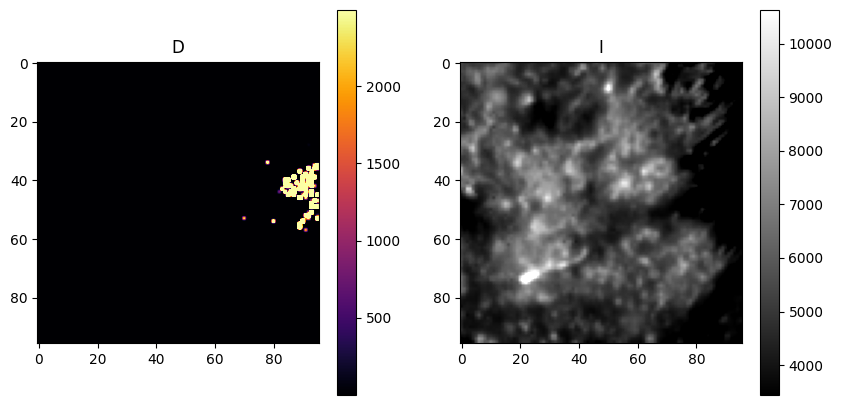

In [24]:
plot_d_and_i_map_single_cell(
    cell_index=0,
    all_image_instance=all_image_instance,
    central_fraction=CENTRAL_FRACTION,
)

numnber of outliers: 4
['tirfmh29_241017_18_w2_cell1_CAV1-KO_DiI100nM-30min_p62_a63d20_2d4mMOA-25m_561nm_283uW_AVR.tif', 'tirfmh29_241017_18_w2_cell1_CAV1-KO_DiI100nM-30min_p62_a63d20_2d4mMOA-25m_561nm_283uW_metadata.xlsx', 'tirfmh29_241017_18_w2_cell1_CAV1-KO_DiI100nM-30min_p62_a63d20_2d4mMOA-25m_561nm_283uW_pt1.xlsx']
(96, 96, 15)
(40, 96, 96)
average D: 71.33739541663873
['tirfmh29_241018_39_w3_cell2_WT_DiI100nM-30min_p62_561nm_588uW_2d4mMOA-120m_pt1.xlsx', 'tirfmh29_241018_39_w3_cell2_WT_DiI100nM-30min_p62_561nm_588uW_2d4mMOA-120m_metadata.xlsx', 'tirfmh29_241018_39_w3_cell2_WT_DiI100nM-30min_p62_561nm_588uW_2d4mMOA-120m_AVR.tif']
(96, 96, 15)
(40, 96, 96)
average D: 94.85367587694898
['tirfmh29_241018_43_w3_cell4_WT_DiI100nM-30min_p62_561nm_588uW_2d4mMOA-150m_pt1.xlsx', 'tirfmh29_241018_43_w3_cell4_WT_DiI100nM-30min_p62_561nm_588uW_2d4mMOA-150m_metadata.xlsx', 'tirfmh29_241018_43_w3_cell4_WT_DiI100nM-30min_p62_561nm_588uW_2d4mMOA-150m_AVR.tif']
(96, 96, 15)
(40, 96, 96)
average D:

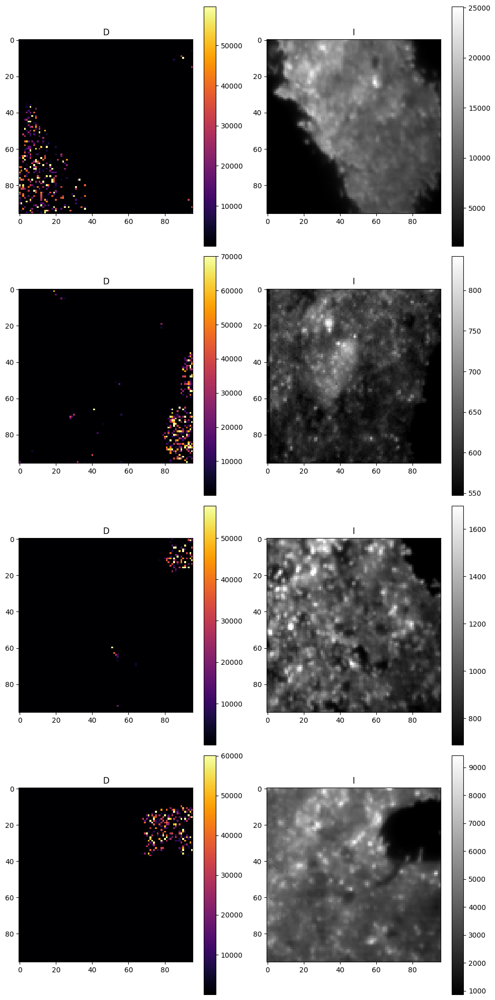

In [25]:
# Plot all outliers D and I map in a figure

n_rows = len(outliers_index)

print(f"numnber of outliers: {len(outliers_index)}")

# Create a subplot grid with n_rows and 2 columns.
fig, axs = plt.subplots(n_rows, 2, figsize=(10, 5 * n_rows))

# If there's only one row, ensure axs is always 2D for consistency.
if n_rows == 1:
    axs = axs.reshape(1, -1)

# Loop over each index and pass the corresponding axes to your plotting function.
for i, idx in enumerate(outliers_index):
    # Assuming your function now accepts ax1 and ax2 to plot on the left and right subplots respectively.
    ax_left = axs[i, 0]
    ax_right = axs[i, 1]

    # Modify your plot_d_and_i_map_single_cell to accept these axes.
    plot_d_and_i_map_single_cell(
        cell_index=idx,
        all_image_instance=all_image_instance,
        central_fraction=CENTRAL_FRACTION,
        fig=fig,
        ax1=ax_left,
        ax2=ax_right,
    )

plt.tight_layout()
plt.show()

In [26]:
# Plot the distrubtion of mean per ROI per cell before and after filtering outlier cluster


def get_d_before_after_filter(
    outlier_index: list[int],
    param_array: np.array,
    center_fraction: float,
    d_threshold: tuple,
):

    # Simple D thresholding

    idx_param = 2  # for diffusion coefficient
    num_files, w, h, p = param_array.shape
    print(
        f"Number of files: {num_files}, width: {w}, height: {h}, number of parameters: {p}"
    )  # diffusion is of index p = 2

    array_before_after = np.zeros((2, len(outlier_index)))

    for i, val in enumerate(outlier_index):
        p_map = param_array[val, :, :, idx_param]

        central_region_p_map = get_central_region(p_map, center_fraction)
        central_region_p_map_filtered = np.where(
            (central_region_p_map < d_threshold[0])
            | (central_region_p_map > d_threshold[1]),
            np.nan,
            central_region_p_map,
        )

        array_before_after[0, i] = np.nanmean(
            central_region_p_map
        )  # append average value of outliers before filtering
        array_before_after[1, i] = np.nanmean(
            central_region_p_map_filtered
        )  # append average value of outliers after filtering

    return array_before_after


d_array_outlier_bef_after_thresholding = get_d_before_after_filter(
    outlier_index=outliers_index,
    param_array=array_parameter_map_all,
    center_fraction=CENTRAL_FRACTION,
    d_threshold=D_THRESHOLD,
)
d_array_non_outlier_bef_after_thresholding = get_d_before_after_filter(
    outlier_index=non_outlier_index,
    param_array=array_parameter_map_all,
    center_fraction=CENTRAL_FRACTION,
    d_threshold=D_THRESHOLD,
)

Number of files: 136, width: 96, height: 96, number of parameters: 15
Number of files: 136, width: 96, height: 96, number of parameters: 15


In [27]:
def plot_paired_comparison_with_boxplot(data, group_labels=None, title=None):
    """
    Function to create a subplot with a paired dataset comparison.

    Parameters:
    - data: numpy array of shape (2, N) where:
        - data[0] contains "before" values
        - data[1] contains "after" values
    - group_labels: list of labels for the pairs (optional)
    """

    before_color = "#009E73"
    after_color = "#E69F00"

    num_pairs = data.shape[1]

    if group_labels is None:
        group_labels = [f"Pair {i+1}" for i in range(num_pairs)]

    x_positions = np.arange(num_pairs)

    # Create subplots (1 row, 2 columns)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # First subplot: Scatter plot with connecting lines
    axes[0].scatter(
        x_positions, data[0], color=before_color, label="Before", zorder=2, s=20
    )
    axes[0].scatter(
        x_positions, data[1], color=after_color, label="After", zorder=2, s=20
    )

    for i in range(num_pairs):
        axes[0].plot(
            [x_positions[i], x_positions[i]],
            [data[0, i], data[1, i]],
            color="gray",
            linestyle="--",
            alpha=0.7,
        )

    axes[0].set_xticks(x_positions)
    axes[0].set_xticklabels(group_labels, rotation=30)
    axes[0].set_ylabel("Diffusion constant")
    axes[0].set_title(f"Paired before and after {title}")
    axes[0].legend()
    axes[0].grid(True, linestyle="--", alpha=0.3)
    axes[0].set_yscale("log")

    # Second subplot: Box plot with mean and median
    box_data = [data[0], data[1]]
    box_colors = [before_color, after_color]

    boxplot = axes[1].boxplot(
        box_data,
        labels=["Before", "After"],
        patch_artist=True,
        boxprops=dict(color="black"),
        capprops=dict(color="black"),
        whiskerprops=dict(color="black"),
        medianprops=dict(color="black"),
    )  # Border color  # Whisker cap color  # Whisker color  # Median line color

    # Set box colors manually
    for patch, color in zip(boxplot["boxes"], box_colors):
        patch.set_facecolor(color)

    # Overlay mean and median points
    for i, d in enumerate(box_data, start=1):
        mean = np.mean(d)
        median = np.median(d)
        axes[1].scatter(
            i, mean, color="black", marker="o", label="Mean" if i == 1 else "", zorder=3
        )

    axes[1].set_title(f"Grouped before and after {title}")
    axes[1].set_ylabel("Diffusion coefficient")
    axes[1].legend()
    axes[1].set_yscale("log")

    plt.tight_layout()
    plt.show()

/var/folders/_j/d7rxzvrs6snf8dky44r4_6mr0000gn/T/ipykernel_53724/1879409150.py:54: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  boxplot = axes[1].boxplot(


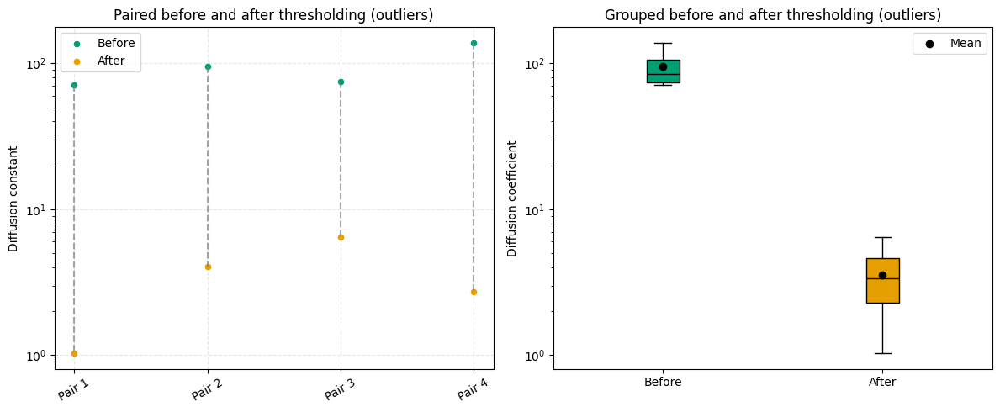

/var/folders/_j/d7rxzvrs6snf8dky44r4_6mr0000gn/T/ipykernel_53724/1879409150.py:54: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  boxplot = axes[1].boxplot(


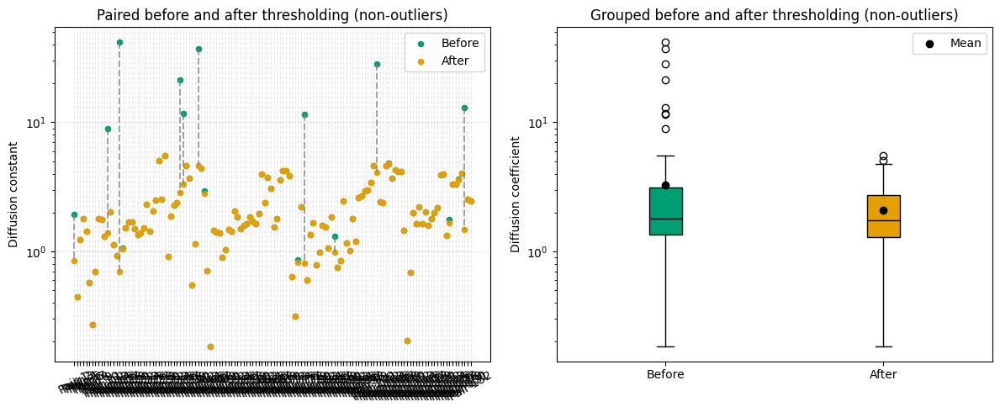

In [28]:
# Shows how the averages changes after thresholding

plot_paired_comparison_with_boxplot(
    d_array_outlier_bef_after_thresholding, title="thresholding (outliers)"
)
plot_paired_comparison_with_boxplot(
    d_array_non_outlier_bef_after_thresholding, title="thresholding (non-outliers)"
)

In [29]:
# Extracting the all the NaN pixels for the outlier cell and plot the ACF with fits


def get_central_region_coordinate(image, center_fraction=0.8):

    h, w = image.shape
    ch, cw = int(h * center_fraction), int(w * center_fraction)  # Central region size
    y_start, x_start = (h - ch) // 2, (w - cw) // 2  # Start indices

    # Extract the central region
    # central_region = image[y_start : y_start + ch, x_start : x_start + cw]

    return y_start, x_start


def get_coordinates(data, y_offset=0, x_offset=0, find_nan=True):
    """
    Function to return the coordinates (row, column) of NaN or non-NaN values in a 2D dataset,
    with an optional offset applied to the coordinates.

    Parameters:
    - data: 2D numpy array
    - y_offset: Integer value to add to row indices (default: 0)
    - x_offset: Integer value to add to column indices (default: 0)
    - find_nan: Boolean flag to determine whether to find NaN (True) or non-NaN (False) values.

    Returns:
    - NumPy array of shape (N, 2) representing (row, column) indices of values (NaN or non-NaN),
      adjusted by the specified offsets.
    """
    condition = (
        np.isnan(data) if find_nan else ~np.isnan(data)
    )  # Find NaN or non-NaN values
    indices = np.argwhere(condition)  # Get coordinates
    return indices + np.array([y_offset, x_offset])  # Apply offsets


# Example usage:
data = np.array([[1, np.nan, 3], [4, 5, np.nan], [np.nan, 8, 9]])

nan_coords = get_coordinates(data)  # Get NaN coordinates
non_nan_coords = get_coordinates(data, find_nan=False)  # Get non-NaN coordinates

print("NaN Coordinates:\n", nan_coords)
print("Non-NaN Coordinates:\n", non_nan_coords)


def get_pixel_location(
    selected_cell_index: list[int],
    param_array: np.array,
    center_fraction: float,
    d_threshold: tuple = None,
    find_nan: bool = True,
):

    idx_param = 2  # for diffusion coefficient
    num_files, w, h, p = param_array.shape
    print(
        f"Number of files: {num_files}, width: {w}, height: {h}, number of parameters: {p}"
    )

    # Store the x, y coord (values) and the index of cell (key) with outlier pixels
    data_store = {}

    for file_idx in selected_cell_index:
        p_map = param_array[file_idx, :, :, idx_param]

        if d_threshold is not None:
            p_map_2 = np.where(
                (p_map < d_threshold[0]) | (p_map > d_threshold[1]), np.nan, p_map
            )
        else:
            p_map_2 = p_map

        p_map_2_central = get_central_region(p_map_2, center_fraction)
        yoff, xoff = get_central_region_coordinate(p_map_2, center_fraction)

        data_store[file_idx] = get_coordinates(
            p_map_2_central, y_offset=yoff, x_offset=xoff, find_nan=find_nan
        )

    return data_store


def plot_one_acf(
    arr_acf: np.array,
    arr_lag: np.array,
    arr_sd: np.array = None,
    arr_fit: np.array = None,
    with_fits: bool = False,
    axs=None,
    is_normalise: bool = False,
    title: str = "ACF",
):
    """
    Plot single acf with or without fit and option to normalised to first (non-zero timelag) and last poin of the fitted acf

    Raises:
        ValueError: _description_
    """

    col_profile = ["#1E88E5", "#D81B60"]

    if len(arr_lag) < 2:
        raise ValueError(
            "t_array must have at least two elements to define the x-axis value."
        )

    assert (
        len(arr_lag) == len(arr_fit) == len(arr_sd) == len(arr_acf)
    ), "non matching lagtime elem"

    if is_normalise:
        norm_i = arr_fit[1]
        norm_inf = arr_fit[arr_fit.shape[0] - 1]

    if axs is None:
        fig, axs = plt.subplots(figsize=(5, 5))

    if is_normalise:
        cf_to_plot = (arr_acf[1:] - norm_inf) / (norm_i - norm_inf)
        fit_cf_to_plot = (arr_fit[1:] - norm_inf) / (norm_i - norm_inf)
    else:
        cf_to_plot = arr_acf[1:]
        fit_cf_to_plot = arr_fit[1:]

    axs.plot(arr_lag[1:], cf_to_plot, color=col_profile[0])

    if with_fits and arr_fit is not None:
        axs.plot(arr_lag[1:], fit_cf_to_plot, color=col_profile[1], alpha=0.3)

    # Add titles, labels, and grid
    axs.set_title(title)
    axs.set_xlabel(r"Time lag $[s]$")
    axs.set_ylabel(r"G$(0)$")
    axs.grid(False)
    axs.set_xscale("log")

    # aspect ratio
    xmin, xmax = axs.get_xlim()
    ymin, ymax = axs.get_ylim()
    x_range = math.log(xmax - xmin)
    y_range = ymax - ymin
    max_range = max(x_range, y_range)
    min_range = min(x_range, y_range)
    axs.set_aspect(max_range / min_range)


def plot_all_acfs(
    arr_acf: np.array,
    arr_lag: np.array,
    arr_sd: np.array = None,
    arr_fit: np.array = None,
    with_fits: bool = False,
    axs=None,
    title: str = None,
    d_values: np.array = None,
    rmsd_values: np.array = None,
    snr_values: np.array = None,
    is_normalise: bool = False,
    output_directory=None,
    save_name="",
):

    col_profile = ["#1E88E5", "#D81B60"]

    if len(arr_lag) < 2:
        raise ValueError(
            "t_array must have at least two elements to define the x-axis value."
        )

    if is_normalise:
        norm_i = arr_fit[:, 1]
        norm_inf = arr_fit[:, arr_fit.shape[1] - 1]

    total_to_plot = arr_acf.shape[0]

    assert (
        len(arr_lag) == len(arr_fit) == len(arr_sd) == len(arr_acf)
    ), "non matching lagtime elem"

    if is_normalise:
        cf_to_plot = (arr_acf[:, 1:] - norm_inf[:, np.newaxis]) / (
            norm_i[:, np.newaxis] - norm_inf[:, np.newaxis]
        )
        fit_cf_to_plot = (arr_fit[:, 1:] - norm_inf[:, np.newaxis]) / (
            norm_i[:, np.newaxis] - norm_inf[:, np.newaxis]
        )
    else:
        cf_to_plot = arr_acf[:, 1:]
        fit_cf_to_plot = arr_fit[:, 1:]

    if axs is None:
        fig, axs = plt.subplots(figsize=(7, 7))

    for i in range(total_to_plot):
        axs.plot(arr_lag[i, 1:], cf_to_plot[i, :], color=col_profile[0])

    if with_fits and arr_fit is not None:
        for i in range(total_to_plot):
            axs.plot(
                arr_lag[i, 1:], fit_cf_to_plot[i, :], color=col_profile[1], alpha=0.3
            )

    # Add titles, labels, and grid
    axs.set_title(f"{title}: {total_to_plot} pixels")
    axs.set_xlabel(r"Time lag $[s]$")
    axs.set_ylabel(r"G$(0)$")
    axs.grid(False)

    axs.set_xscale("log")

    # aspect ratio
    xmin, xmax = axs.get_xlim()
    ymin, ymax = axs.get_ylim()
    x_range = math.log(xmax - xmin)
    y_range = ymax - ymin
    max_range = max(x_range, y_range)
    min_range = min(x_range, y_range)
    axs.set_aspect(max_range / min_range)

    # Add function text box on the top right corner
    function_text = f"""Diffusion coefficient: {np.nanmean(d_values):.1f} \u00b1 {np.nanstd(d_values):.1f}
    RMSD: {np.nanmean(rmsd_values):.1f} \u00b1 {np.nanstd(rmsd_values):.1f}
    SNR: {np.nanmean(snr_values):.1f} \u00b1 {np.nanstd(snr_values):.1f}"""
    axs.text(
        0.95,
        0.95,
        function_text,
        transform=axs.transAxes,
        fontsize=10,
        verticalalignment="top",
        horizontalalignment="right",
        bbox=dict(
            boxstyle="round,pad=0.3", edgecolor="black", facecolor="white", alpha=0.7
        ),
    )

    if output_directory is not None:
        save_name += ".svg"
        os.makedirs(output_directory, exist_ok=True)
        save_path = os.path.join(output_directory, save_name)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        plt.close()


def get_nrmsd(observed: np.array, predicted: np.array, N_fit: np.array):
    """
    Calculate the residual mean square displacement (RMSD) for all pixels using vectorized operations.

    Parameters:
    observed (numpy.ndarray): A 2D array of observed values with shape [n, t].
    predicted (numpy.ndarray): A 2D array of predicted values with the same shape as `observed`.
    N_fit (numpy.ndarray): A 1D array of fitted N for normalisation

    Returns:
    numpy.ndarray: A 1D array of RMSD values with shape [n].
    """
    if observed.shape != predicted.shape:
        raise ValueError("Observed and predicted arrays must have the same shape.")

    # Calculate residuals, square them, and take the mean along the last axis (t)
    # Exclude time lag 0
    residuals_squared_mean = np.sum((observed[:, 1:] - predicted[:, 1:]) ** 2, axis=1)

    # Compute the square root of the mean residuals to get RMSD
    rmsd_matrix = np.sqrt(residuals_squared_mean)

    # Normalisation
    rmsd_matrix *= N_fit

    return rmsd_matrix


def get_snr(cf: np.array, last_lag: int = 6):
    """
    Calculate the signal to noise ratio (SNR) of correlation function for all element using vectorized operations.

    Parameters:
    cf (numpy.ndarray): A 2D array of cf values with shape [n, t].
    last_lag (int): number of first few lag times (N) of an autocorrelationfunction used in calculation

    Returns:
    numpy.ndarray: A 1D array of SNR values with shape [n].
    """

    mean = np.mean(cf[:, 1:last_lag], axis=1)
    std = np.std(cf[:, 1:last_lag], axis=1)

    snr = np.divide(mean, std)

    return snr


def plot_acfs_selected_pixels(
    selected_cell_index: list[int],
    param_array: np.array,
    array_lagtimes: np.array,
    array_acf1: np.array,
    array_fit1: np.array,
    array_sd1: np.array,
    title: str,
    center_fraction: float,
    d_threshold: tuple = None,
    num_samples: int = None,
    is_normalise: bool = False,
    find_nan: bool = True,
):
    """
    Plot the either the outlier or non outlier pixels from different cluster of cells
    """

    selected_pixels = get_pixel_location(
        selected_cell_index=selected_cell_index,
        param_array=param_array,
        center_fraction=center_fraction,
        d_threshold=d_threshold,
        find_nan=find_nan,
    )

    print(f"len total cell: {len(selected_pixels)}")

    num_selected_pixels = 0
    for key, value in selected_pixels.items():
        for i in range(value.shape[0]):
            num_selected_pixels += 1

    print(f"total seleted pixel: {num_selected_pixels}")

    assert (
        array_lagtimes.shape[1]
        == array_acf1.shape[3]
        == array_fit1.shape[3]
        == array_sd1.shape[3]
    ), " NOK mismartch arr size"

    all_selected_arr = np.empty(
        (num_selected_pixels, 4, array_lagtimes.shape[1])
    )  # order: lagtime, acf1, fit1, sd1
    all_selected_d = np.empty((num_selected_pixels))
    all_selected_n = np.empty((num_selected_pixels))

    counter = 0
    for key, value in selected_pixels.items():
        # print(f"cell index: {key}, array outlier coord: {value.shape}")
        for i in range(value.shape[0]):
            xi = value[i, 0]
            yi = value[i, 1]
            # print(f"pixel number: {i}, x: {xi}, y: {yi}, D: {array_parameter_map_all[key, xi, yi, 2]}")

            all_selected_arr[counter, 0, :] = array_lagtimes[key]
            all_selected_arr[counter, 1, :] = array_acf1[key, xi, yi]
            all_selected_arr[counter, 2, :] = array_fit1[key, xi, yi]
            all_selected_arr[counter, 3, :] = array_sd1[key, xi, yi]

            all_selected_d[counter] = array_parameter_map_all[key, xi, yi, 2]
            all_selected_n[counter] = array_parameter_map_all[key, xi, yi, 1]

            counter += 1

            # plotter for a single acf
            # plot_one_acf(arr_acf=array_acf1[key, xi, yi], arr_lag=array_lagtimes[key], arr_sd=array_sd1[key, xi, yi], arr_fit=array_fit1[key, xi, yi], with_fits=True)

    # randomly select samples from pool of pixels
    if num_samples is not None:
        # Randomly select `num_selected_pixels` unique indices from the first axis
        selected_indices = random.sample(range(num_selected_pixels), num_samples)

        # Create arrays for new sampled array
        new_selected_arr = np.empty((num_samples, 4, array_lagtimes.shape[1]))
        new_selected_d = np.empty((num_samples))
        new_selected_n = np.empty((num_samples))

        # Populate new sampled arrays
        new_selected_arr[:, 0, :] = all_selected_arr[selected_indices, 0, :]  # Lagtime
        new_selected_arr[:, 1, :] = all_selected_arr[selected_indices, 1, :]  # ACF1
        new_selected_arr[:, 2, :] = all_selected_arr[selected_indices, 2, :]  # Fit1
        new_selected_arr[:, 3, :] = all_selected_arr[selected_indices, 3, :]  # SD1

        new_selected_d[:] = all_selected_d[selected_indices]
        new_selected_n[:] = all_selected_n[selected_indices]

        all_selected_arr = new_selected_arr
        all_selected_d = new_selected_d
        all_selected_n = new_selected_n

    arr_nrmsd = get_nrmsd(
        observed=all_selected_arr[:, 1, :],
        predicted=all_selected_arr[:, 2, :],
        N_fit=all_selected_n,
    )
    arr_snr = get_snr(cf=all_selected_arr[:, 1, :])
    plot_all_acfs(
        arr_acf=all_selected_arr[:, 1, :],
        arr_lag=all_selected_arr[:, 0, :],
        arr_sd=all_selected_arr[:, 3, :],
        arr_fit=all_selected_arr[:, 2, :],
        with_fits=True,
        title=title,
        d_values=all_selected_d,
        rmsd_values=arr_nrmsd,
        snr_values=arr_snr,
        is_normalise=is_normalise,
    )

NaN Coordinates:
 [[0 1]
 [1 2]
 [2 0]]
Non-NaN Coordinates:
 [[0 0]
 [0 2]
 [1 0]
 [1 1]
 [2 1]
 [2 2]]


Number of files: 136, width: 96, height: 96, number of parameters: 15
len total cell: 4
total seleted pixel: 104


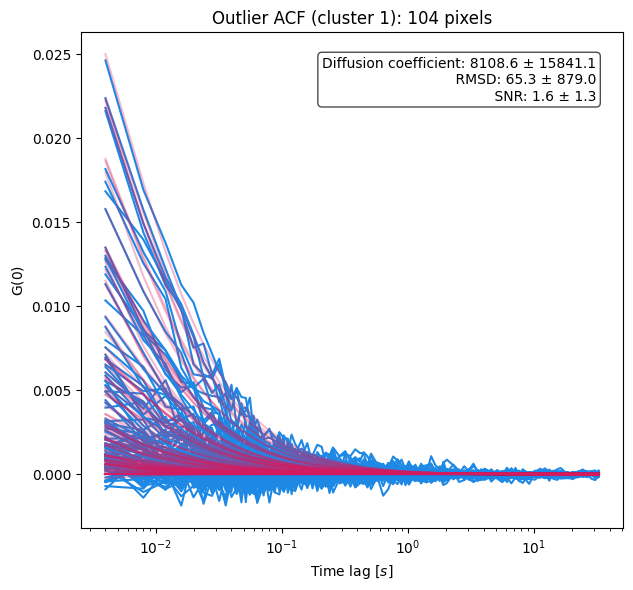

In [30]:
# Plot the outlier pixels
plot_acfs_selected_pixels(
    selected_cell_index=outliers_index,
    param_array=array_parameter_map_all,
    array_lagtimes=array_lagtimes,
    array_acf1=array_acf1,
    array_fit1=array_fit1,
    array_sd1=array_sd1,
    title="Outlier ACF (cluster 1)",
    center_fraction=CENTRAL_FRACTION,
    d_threshold=D_THRESHOLD,
    find_nan=True,
)

Number of files: 136, width: 96, height: 96, number of parameters: 15
len total cell: 132
total seleted pixel: 86


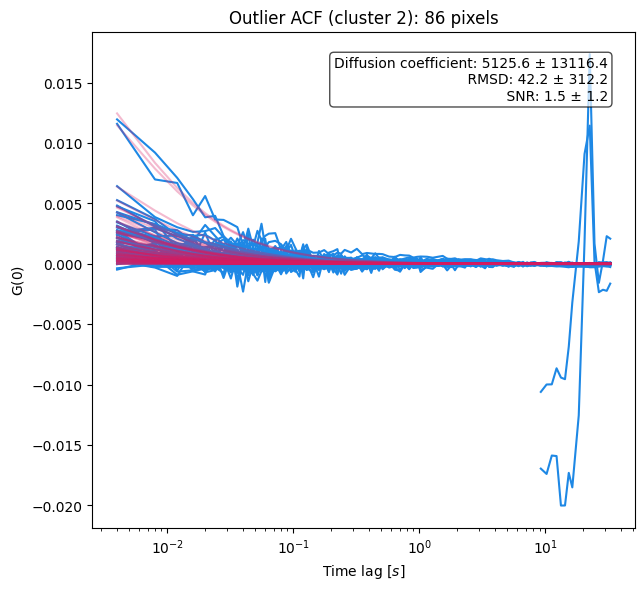

In [31]:
# Plot the non-outlier pixels
plot_acfs_selected_pixels(
    selected_cell_index=non_outlier_index,
    param_array=array_parameter_map_all,
    array_lagtimes=array_lagtimes,
    array_acf1=array_acf1,
    array_fit1=array_fit1,
    array_sd1=array_sd1,
    title="Outlier ACF (cluster 2)",
    center_fraction=CENTRAL_FRACTION,
    d_threshold=D_THRESHOLD,
    find_nan=True,
)

Number of files: 136, width: 96, height: 96, number of parameters: 15
len total cell: 4
total seleted pixel: 9112


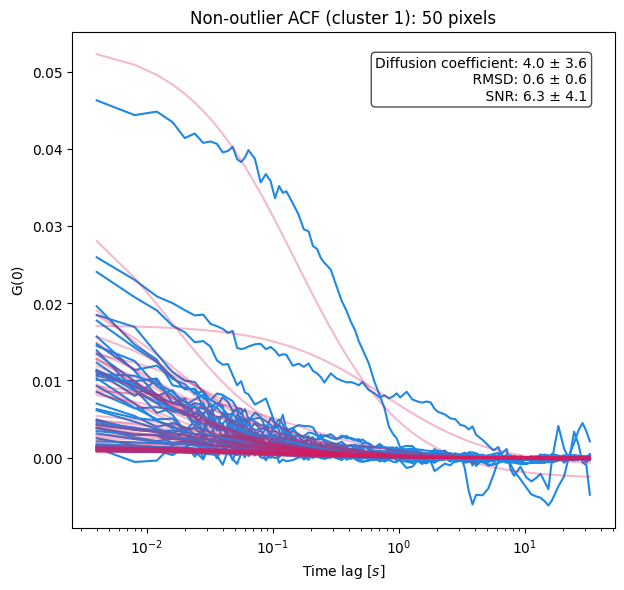

In [32]:
# Plot the non-outlier pixels from bad cluster
plot_acfs_selected_pixels(
    selected_cell_index=outliers_index,
    param_array=array_parameter_map_all,
    array_lagtimes=array_lagtimes,
    array_acf1=array_acf1,
    array_fit1=array_fit1,
    array_sd1=array_sd1,
    title="Non-outlier ACF (cluster 1)",
    center_fraction=CENTRAL_FRACTION,
    d_threshold=D_THRESHOLD,
    num_samples=50,
    find_nan=False,
)

Number of files: 136, width: 96, height: 96, number of parameters: 15
len total cell: 132
total seleted pixel: 304042


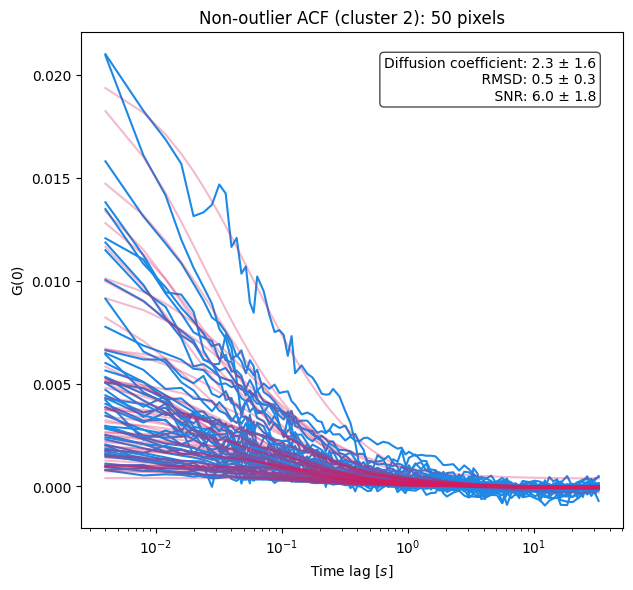

In [33]:
# Plot the non-outlier pixels from good cluster
plot_acfs_selected_pixels(
    selected_cell_index=non_outlier_index,
    param_array=array_parameter_map_all,
    array_lagtimes=array_lagtimes,
    array_acf1=array_acf1,
    array_fit1=array_fit1,
    array_sd1=array_sd1,
    title="Non-outlier ACF (cluster 2)",
    center_fraction=CENTRAL_FRACTION,
    d_threshold=D_THRESHOLD,
    num_samples=50,
    find_nan=False,
)

Number of files: 136, width: 96, height: 96, number of parameters: 15
len total cell: 132
total seleted pixel: 304112


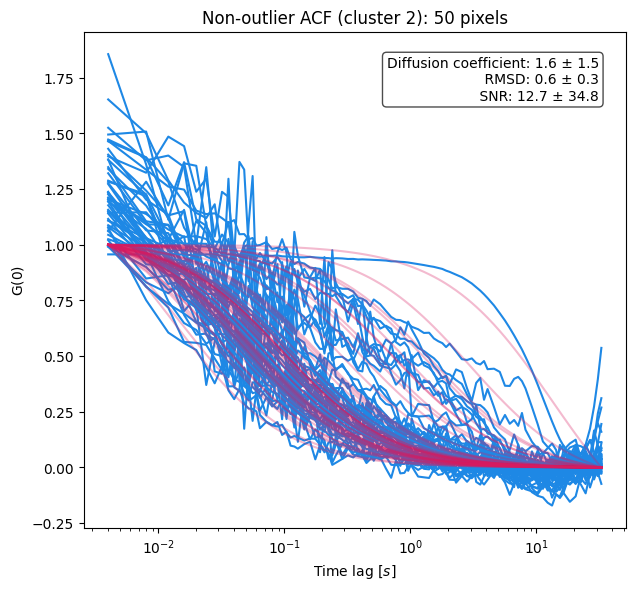

In [34]:
plot_acfs_selected_pixels(
    selected_cell_index=non_outlier_index,
    param_array=array_parameter_map_all,
    array_lagtimes=array_lagtimes,
    array_acf1=array_acf1,
    array_fit1=array_fit1,
    array_sd1=array_sd1,
    title="Non-outlier ACF (cluster 2)",
    center_fraction=CENTRAL_FRACTION,
    d_threshold=None,
    num_samples=50,
    is_normalise=True,
    find_nan=False,
)

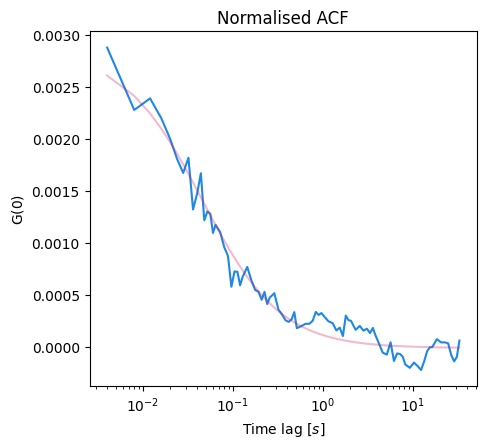

In [35]:
plot_one_acf(
    arr_acf=array_acf1[0, 24, 24],
    arr_lag=array_lagtimes[0],
    arr_sd=array_sd1[0, 24, 24],
    arr_fit=array_fit1[0, 24, 24],
    with_fits=True,
    is_normalise=False,
    title="Normalised ACF",
)

tirfmh29_241018_04_w1_cell2_WT_DiI100nM-30min_p62_a63d20_561nm_283uW
tirfmh29_241018_04_w1_cell2_WT_DiI100nM-30min_p62_a63d20_561nm_283uW


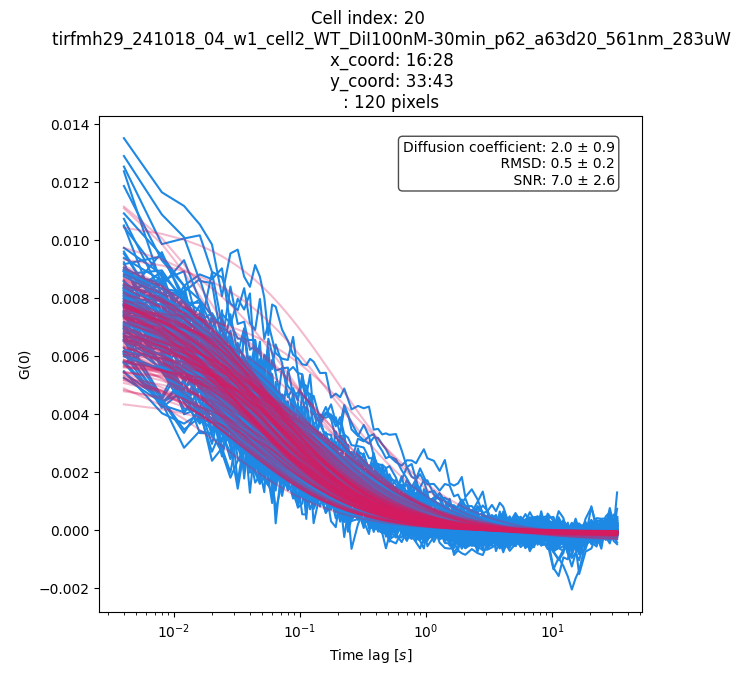

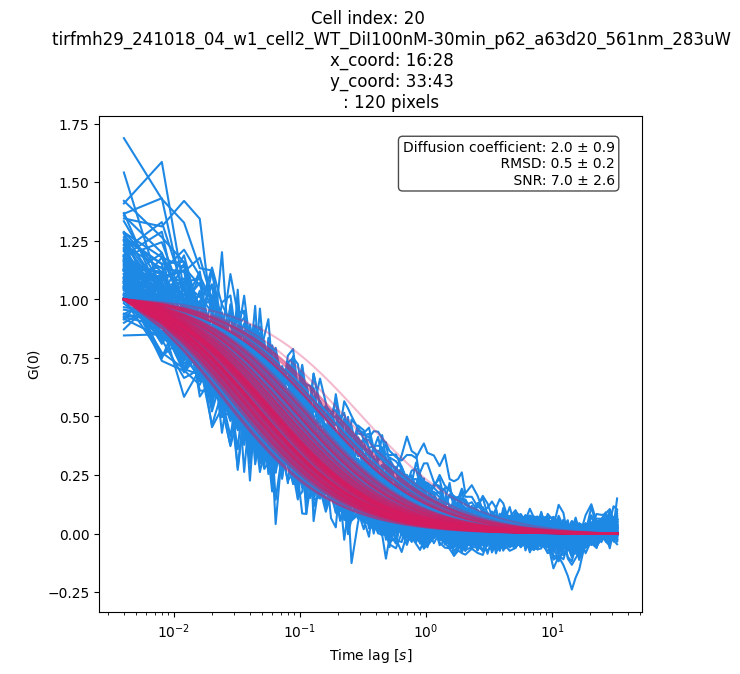

In [36]:
# Plotting selected ROI from a selected cell

CELLID = 20
XSTART = 16
XEND = 28
YSTART = 33
YEND = 43


def plot_roi_defined_with_reshape(
    cell_idx: int,
    x_start: int,
    x_end: int,
    y_start: int,
    y_end: int,
    array_acf1: np.array,
    array_fit1: np.array,
    array_parameter_map_all: np.array,
    array_lagtimes: np.array,
    array_sd1: np.array,
    list_basename_all: list,
    title: str,
    is_normalised: bool = False,
    output_directory=None,
    save_name="",
):

    # reshape first
    acf = array_acf1[cell_idx, x_start:x_end, y_start:y_end, :].reshape(
        -1, array_acf1.shape[-1]
    )
    fit = array_fit1[cell_idx, x_start:x_end, y_start:y_end, :].reshape(
        -1, array_fit1.shape[-1]
    )
    n = array_parameter_map_all[cell_idx, x_start:x_end, y_start:y_end, 1].flatten()
    lag = np.tile(array_lagtimes[cell_idx, :], (acf.shape[0], 1))
    sd = array_sd1[cell_idx, x_start:x_end, y_start:y_end, :].reshape(
        -1, array_sd1.shape[-1]
    )
    pmap = array_parameter_map_all[cell_idx, x_start:x_end, y_start:y_end, 2]

    arr_nrmsd = get_nrmsd(observed=acf, predicted=fit, N_fit=n)
    arr_snr = get_snr(cf=acf)
    plot_all_acfs(
        arr_acf=acf,
        arr_lag=lag,
        arr_sd=sd,
        arr_fit=fit,
        with_fits=True,
        title=f"""Cell index: {cell_idx} 
        {list_basename_all[cell_idx]}
        x_coord: {x_start}:{x_end}
        y_coord: {y_start}:{y_end}
        """,
        d_values=pmap,
        rmsd_values=arr_nrmsd,
        snr_values=arr_snr,
        is_normalise=is_normalised,
        output_directory=output_directory,
        save_name=save_name,
    )

    print(list_basename_all[cell_idx])


# row-based major
plot_roi_defined_with_reshape(
    cell_idx=CELLID,
    x_start=XSTART,
    x_end=XEND,
    y_start=YSTART,
    y_end=YEND,
    array_acf1=array_acf1,
    array_fit1=array_fit1,
    array_parameter_map_all=array_parameter_map_all,
    array_lagtimes=array_lagtimes,
    array_sd1=array_sd1,
    list_basename_all=list_basename_all,
    title="ACFs",
    is_normalised=False,
    output_directory=None,
    save_name="sample acf not normalised",
)

# row-based major
plot_roi_defined_with_reshape(
    cell_idx=CELLID,
    x_start=XSTART,
    x_end=XEND,
    y_start=YSTART,
    y_end=YEND,
    array_acf1=array_acf1,
    array_fit1=array_fit1,
    array_parameter_map_all=array_parameter_map_all,
    array_lagtimes=array_lagtimes,
    array_sd1=array_sd1,
    list_basename_all=list_basename_all,
    title="Normalised ACFs",
    is_normalised=True,
    output_directory=None,
    save_name="sample acf normalised",
)

In [37]:
# Sorting filename into list of different group
"""
destination_path = "/Users/zpe-4/Downloads/sorting_basename_oa_dii.txt"  # Change this to your desired path

with open(destination_path, "w") as file:
    for i, fn in enumerate(list_basename_all):
        line = f"index: {i}, name: {fn}\n"
        file.write(line)  # Write each line to the file

print(f"txt file saved at: {destination_path}")
"""


# group 1
cav1_ko_neat = [0, 1, 2, 3, 4, 5, 6, 7, 8]
cav1_ko_oa = [9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
wt_neat = [
    19,
    20,
    21,
    22,
    23,
    24,
    25,
    26,
    27,
    28,
    29,
    30,
    46,
    47,
    48,
    49,
    50,
    51,
    52,
    53,
    54,
    55,
    56,
    57,
    58,
    59,
    60,
    61,
    62,
    63,
    64,
    65,
    66,
    83,
    84,
    85,
    86,
    87,
    88,
    89,
    90,
    91,
    92,
    93,
    94,
    113,
    114,
    115,
    116,
    117,
    118,
    119,
    120,
    121,
    122,
    123,
    124,
    125,
    126,
    127,
]
wt_oa = [
    31,
    32,
    33,
    34,
    35,
    36,
    37,
    38,
    39,
    40,
    41,
    42,
    43,
    44,
    45,
    67,
    68,
    69,
    70,
    71,
    72,
    73,
    74,
    75,
    76,
    77,
    78,
    79,
    80,
    81,
    82,
    95,
    96,
    97,
    98,
    99,
    100,
    101,
    102,
    103,
    104,
    105,
    106,
    107,
    108,
    109,
    110,
    111,
    112,
    128,
    129,
    130,
    131,
    132,
    133,
    134,
    135,
]
print(f"wt oa: {len(wt_oa)}")

# group 2, sort laser power

cav1_ko_neat_300uW = [0, 1, 2, 3, 4, 5, 6, 7, 8]
cav1_ko_neat_600uW = [9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
wt_neat_300uW = [
    19,
    20,
    114,
    115,
    116,
    117,
    118,
    119,
    120,
    121,
    122,
    123,
    124,
    125,
    126,
    127,
]
wt_neat_600uW = [
    21,
    22,
    23,
    24,
    25,
    26,
    27,
    28,
    29,
    30,
    46,
    47,
    48,
    49,
    50,
    51,
    52,
    53,
    54,
    55,
    56,
    57,
    58,
    59,
    60,
    61,
    62,
    63,
    64,
    65,
    66,
    83,
    84,
    85,
    86,
    87,
    88,
    89,
    90,
    91,
    92,
    93,
    94,
    113,
]
wt_oa_600uW = [
    31,
    32,
    33,
    34,
    35,
    36,
    37,
    38,
    39,
    40,
    41,
    42,
    43,
    44,
    45,
    67,
    68,
    69,
    70,
    71,
    72,
    73,
    74,
    75,
    76,
    77,
    78,
    79,
    80,
    81,
    82,
    95,
    96,
    97,
    98,
    99,
    100,
    101,
    102,
    103,
    104,
    105,
    106,
    107,
    108,
    109,
    110,
    111,
    112,
    128,
    129,
    130,
    131,
    132,
    133,
    134,
    135,
]
print(f"wt oa 600uW: {len(wt_oa_600uW)}")
print(f"wt_neat_600uW: {len(wt_neat_600uW)}")

"""
destination_path = "/Users/zpe-4/Downloads/sorting_basename_oa_dii-2.txt"  # Change this to your desired path
with open(destination_path, "w") as file:
    for val in wt_oa_600uW:
        line = f"index: {val}, name: {list_basename_all[val]}\n"
        file.write(line)  # Write each line to the file

print(f"txt file saved at: {destination_path}")
"""

# group 3 sort different timing of OA (early < 1 hour), (late > 1 hour)
# exclusive
wt_oa_600uW_lessthan1hour = [31, 32, 33, 67, 68, 69, 70, 95, 96, 97]
wt_oa_600uW_1to2hour = [34, 35, 36, 37, 71, 72, 73, 74, 75, 98, 99, 100, 101]
wt_oa_600uW_2to3hour = [
    38,
    39,
    40,
    41,
    42,
    43,
    44,
    45,
    76,
    77,
    78,
    102,
    103,
    104,
    105,
    128,
    129,
    130,
    131,
    132,
    134,
    135,
]
wt_oa_600uW_morethan3hour = [79, 80, 81, 82, 106, 107, 108, 109, 110, 111, 112, 133]

print(
    f"wt oa 600 : {len(wt_oa_600uW_lessthan1hour) + len(wt_oa_600uW_1to2hour) + len(wt_oa_600uW_2to3hour) + len(wt_oa_600uW_morethan3hour)}"
)

wt oa: 57
wt oa 600uW: 57
wt_neat_600uW: 44
wt oa 600 : 57


In [38]:
def plot_boxplot_across_groups(
    group_indices: dict,
    diffusion_maps: np.array,
    center_fraction: float,
    figure_size: tuple = (20, 8),
    scatter_colors: list = None,
    s_scatter: int = 10,
    is_save: bool = False,
    plot_file_name: str = None,
):

    if scatter_colors is not None:
        assert len(scatter_colors) == len(
            group_indices
        ), "mismatch length of scatter_colors"
    else:
        scatter_colors = len(group_indices) * ["black"]

    # Create dictionary to hold diffusion values for grouped arrays
    grouped_arrays = {
        group: diffusion_maps[indices] for group, indices in group_indices.items()
    }

    # Compute averages per cell per group
    group_averages = {}

    for group, arr in grouped_arrays.items():
        print(
            f"{group}: {arr.shape}"
        )  # Each value is (x, 96, 96) where x = number of indices in list
        n = arr.shape[0]  # Number of elements in first axis
        avg_per_element = [
            np.nanmean(
                get_central_region(image=arr[i], center_fraction=center_fraction)
            )
            for i in range(n)
        ]  # Generate averages per group
        group_averages[group] = np.array(avg_per_element)  # Store as NumPy array

    # plot boxplot group_averages

    # Convert dictionary values to a list for boxplot
    boxplot_data = list(group_averages.values())  # Extract the 1D arrays
    group_labels = list(group_averages.keys())  # Extract group names

    # Store pairwise t-test results
    pairwise_results = []

    # Perform pairwise t-tests
    for (group1, data1), (group2, data2) in itertools.combinations(
        zip(group_labels, boxplot_data), 2
    ):
        t_stat, p_value = ttest_ind(
            data1, data2, equal_var=False
        )  # Welch's t-test (handles unequal variances)

        pairwise_results.append([group1, group2, t_stat, p_value])

    # Convert results to DataFrame
    pairwise_df = pd.DataFrame(
        pairwise_results, columns=["Group 1", "Group 2", "T-statistic", "P-value"]
    )

    # Adjust p-values for multiple comparisons (Bonferroni correction)
    # pairwise_df["Adjusted P-value"] = pairwise_df["P-value"] * len(pairwise_df)  # Bonferroni correction
    pairwise_df["Significant"] = pairwise_df["P-value"] < 0.05  # Mark significance

    # Display the results
    print(tabulate(pairwise_df, headers="keys", tablefmt="grid"))

    # Create figure
    plt.figure(figsize=figure_size)

    # Create the box plot
    boxprops = dict(
        facecolor="none", edgecolor="black", linewidth=1.5
    )  # No fill, black edges
    plt.boxplot(
        boxplot_data,
        labels=group_labels,
        patch_artist=True,
        boxprops=boxprops,
        medianprops={"color": "black"},
    )

    # Scatter plot for each group
    for i, (group, values) in enumerate(group_averages.items(), start=1):
        # Jitter x-axis values for better visibility
        x_jitter = np.random.normal(i, 0.05, size=len(values))  # Small random offset
        plt.scatter(
            x_jitter, values, alpha=0.6, color=scatter_colors[i - 1], s=s_scatter
        )  # Overlay scatter points

    # Set log scale on Y-axis
    # plt.yscale("log")

    # Remove the bounding box (top & right spines)
    ax = plt.gca()

    # Keep only x and y axes
    ax.spines["bottom"].set_linewidth(1.5)
    ax.spines["left"].set_linewidth(1.5)

    # Add title and labels
    plt.title("")
    plt.ylabel(r"Diffusion coefficient $[\mu m^2/s]$")
    plt.xlabel("")

    # Rotate x-axis labels
    plt.xticks(rotation=45, ha="right")

    # Show the plot
    plt.tight_layout()

    # Save if needed
    if is_save:
        plt.savefig(f"{output_path}/{plot_file_name}", format="eps", dpi=300)

    plt.show()


def tabulate_no_independent_cells(group_name):
    # Dictionary to store unique independent cell counts per date
    independent_cells_per_date = defaultdict(set)

    # Regular expression pattern to extract date and cell number
    pattern = re.compile(r"_(\d{6})_.*_cell(\d+)_")

    # Process each filename
    for filename in group_name:
        match = pattern.search(filename)
        if match:
            date, cell = match.groups()
            independent_cells_per_date[date].add(cell)

    # Convert to a dictionary with count of independent cells per date
    independent_cell_counts = {
        date: len(cells) for date, cells in independent_cells_per_date.items()
    }

    # Compute the total sum of unique independent cells
    total_unique_cells = sum(independent_cell_counts.values())

    # Display results
    df = pd.DataFrame(
        list(independent_cell_counts.items()),
        columns=["Date", "Unique Independent Cells"],
    )
    print(tabulate(df, headers="keys", tablefmt="grid"))

    return total_unique_cells

cav1_ko_neat: (9, 96, 96)
cav1_ko_oa: (10, 96, 96)
wt_neat: (60, 96, 96)
wt_oa: (57, 96, 96)
cav1_ko_neat_300uW: (9, 96, 96)
cav1_ko_neat_600uW: (10, 96, 96)
wt_neat_300uW: (16, 96, 96)
wt_neat_600uW: (44, 96, 96)
wt_oa_600uW: (57, 96, 96)
wt_oa_600uW_lessthan1hour: (10, 96, 96)
wt_oa_600uW_1to2hour: (13, 96, 96)
wt_oa_600uW_2to3hour: (22, 96, 96)
wt_oa_600uW_morethan3hour: (12, 96, 96)
+----+---------------------------+---------------------------+---------------+-------------+---------------+
|    | Group 1                   | Group 2                   |   T-statistic |     P-value | Significant   |
+====+===========================+===========================+===============+=============+===============+
|  0 | cav1_ko_neat              | cav1_ko_oa                |    -1.18997   | 0.25362     | False         |
+----+---------------------------+---------------------------+---------------+-------------+---------------+
|  1 | cav1_ko_neat              | wt_neat                   |   

/var/folders/_j/d7rxzvrs6snf8dky44r4_6mr0000gn/T/ipykernel_53724/2782243470.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


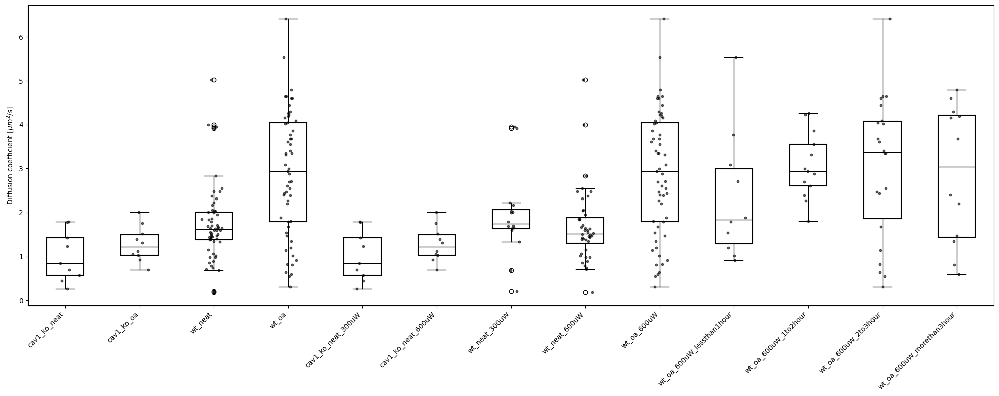

***
cav1_ko_neat
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241017 |                          6 |
+----+--------+----------------------------+

Total Unique Independent Cells: 6
***
cav1_ko_oa
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241017 |                          4 |
+----+--------+----------------------------+

Total Unique Independent Cells: 4
***
wt_neat
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241018 |                          6 |
+----+--------+----------------------------+
|  1 | 241022 |                          5 |
+----+--------+----------------------------+
|  2 | 241023 |                          7 |
+----+--------+----------------------------+
|  3 | 241025 |                

In [39]:
plt.close('all')
%matplotlib inline

group_indices = {
    "cav1_ko_neat": cav1_ko_neat,
    "cav1_ko_oa": cav1_ko_oa,
    "wt_neat": wt_neat,
    "wt_oa": wt_oa,
    "cav1_ko_neat_300uW": cav1_ko_neat_300uW,
    "cav1_ko_neat_600uW": cav1_ko_neat_600uW,
    "wt_neat_300uW": wt_neat_300uW,
    "wt_neat_600uW": wt_neat_600uW,
    "wt_oa_600uW": wt_oa_600uW,
    "wt_oa_600uW_lessthan1hour": wt_oa_600uW_lessthan1hour,
    "wt_oa_600uW_1to2hour": wt_oa_600uW_1to2hour,
    "wt_oa_600uW_2to3hour": wt_oa_600uW_2to3hour,
    "wt_oa_600uW_morethan3hour": wt_oa_600uW_morethan3hour,
}

plot_boxplot_across_groups(group_indices=group_indices, diffusion_maps=diffusion_maps_thres, center_fraction=CENTRAL_FRACTION)

dict_filenames_of_groups = {group: [list_basename_all[i] for i in indices] for group, indices in group_indices.items()}

for groups, filenames in dict_filenames_of_groups.items():
    print("***")
    print(groups)
    total_cells = tabulate_no_independent_cells(filenames)
    print("\nTotal Unique Independent Cells:", total_cells)

for figure


In [40]:
# Define global font settings
FONT_FAMILY = "Arial"
FONT_SIZE = 14


# Function to apply consistent font settings across plots
def set_plot_fonts():
    plt.rcParams.update(
        {
            "font.family": FONT_FAMILY,
            "font.size": FONT_SIZE,
            "axes.titlesize": FONT_SIZE + 2,
            "axes.labelsize": FONT_SIZE,
            "xtick.labelsize": FONT_SIZE - 2,
            "ytick.labelsize": FONT_SIZE - 2,
            "legend.fontsize": FONT_SIZE,
            "axes.spines.top": False,  # Disable top spine
            "axes.spines.right": False,  # Disable right spine
            "axes.linewidth": 1,  # Set axis line width globally
        }
    )

/var/folders/_j/d7rxzvrs6snf8dky44r4_6mr0000gn/T/ipykernel_53724/2782243470.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


$\text{MEF (untreated)}$: (44, 96, 96)
$\text{MEF} (+ OA\ < 1\ \text{hr})$: (10, 96, 96)
$\text{MEF} (+ OA\ 1 - 2\ \text{hr})$: (13, 96, 96)
$\text{MEF} (+ OA\ 2 - 3\ \text{hr})$: (22, 96, 96)
$\text{MEF} (+ OA\ >3\ \text{hr})$: (12, 96, 96)
+----+---------------------------------------+---------------------------------------+---------------+------------+---------------+
|    | Group 1                               | Group 2                               |   T-statistic |    P-value | Significant   |
+====+=======================================+=======================================+===============+============+===============+
|  0 | $\text{MEF (untreated)}$              | $\text{MEF} (+ OA\ < 1\ \text{hr})$   |    -1.39685   | 0.191586   | False         |
+----+---------------------------------------+---------------------------------------+---------------+------------+---------------+
|  1 | $\text{MEF (untreated)}$              | $\text{MEF} (+ OA\ 1 - 2\ \text{hr})$ |    -5.66613

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


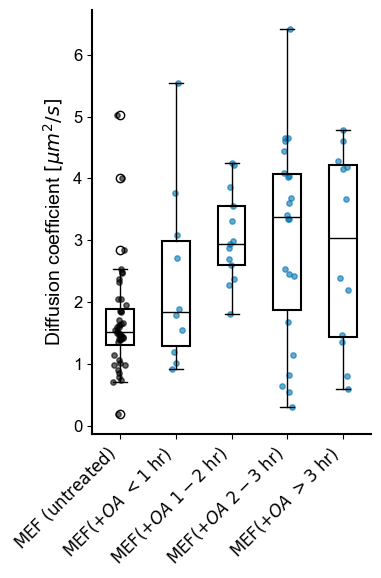

***
$\text{MEF (untreated)}$
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241018 |                          6 |
+----+--------+----------------------------+
|  1 | 241022 |                          5 |
+----+--------+----------------------------+
|  2 | 241023 |                          7 |
+----+--------+----------------------------+
|  3 | 241025 |                          4 |
+----+--------+----------------------------+

Total Independent Cells: 22
***
$\text{MEF} (+ OA\ < 1\ \text{hr})$
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241018 |                          2 |
+----+--------+----------------------------+
|  1 | 241022 |                          4 |
+----+--------+----------------------------+
|  2 | 241025 |                          2 |
+----+--------+----------------------------+

T

In [41]:
plt.close('all')
%matplotlib inline



group_indices = {
    r"$\text{MEF (untreated)}$": wt_neat_600uW,
    r"$\text{MEF} (+ OA\ < 1\ \text{hr})$": wt_oa_600uW_lessthan1hour,
    r"$\text{MEF} (+ OA\ 1 - 2\ \text{hr})$": wt_oa_600uW_1to2hour,
    r"$\text{MEF} (+ OA\ 2 - 3\ \text{hr})$": wt_oa_600uW_2to3hour,
    r"$\text{MEF} (+ OA\ >3\ \text{hr})$": wt_oa_600uW_morethan3hour,
}



set_plot_fonts()
plot_boxplot_across_groups(group_indices=group_indices, diffusion_maps=diffusion_maps_thres, center_fraction=CENTRAL_FRACTION, figure_size=(4,6), scatter_colors=['#000000','#0173b2','#0173b2','#0173b2', '#0173b2'], s_scatter=15, is_save=IS_SAVE_PLOT, plot_file_name = "nb017_mef-dii-compare-untreated-treated.eps")
plt.rcdefaults()  # Resets to Matplotlib default settings

dict_filenames_of_groups = {group: [list_basename_all[i] for i in indices] for group, indices in group_indices.items()}

for groups, filenames in dict_filenames_of_groups.items():
    print("***")
    print(groups)
    total_cells = tabulate_no_independent_cells(filenames)
    print("\nTotal Independent Cells:", total_cells)

/var/folders/_j/d7rxzvrs6snf8dky44r4_6mr0000gn/T/ipykernel_53724/2782243470.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


$\text{MEF (untreated)}\ 300\ \mu W$: (16, 96, 96)
$\text{MEF (untreated)}\ 600\ \mu W$: (44, 96, 96)
+----+--------------------------------------+--------------------------------------+---------------+-----------+---------------+
|    | Group 1                              | Group 2                              |   T-statistic |   P-value | Significant   |
+====+======================================+======================================+===============+===========+===============+
|  0 | $\text{MEF (untreated)}\ 300\ \mu W$ | $\text{MEF (untreated)}\ 600\ \mu W$ |      0.883041 |  0.385957 | False         |
+----+--------------------------------------+--------------------------------------+---------------+-----------+---------------+


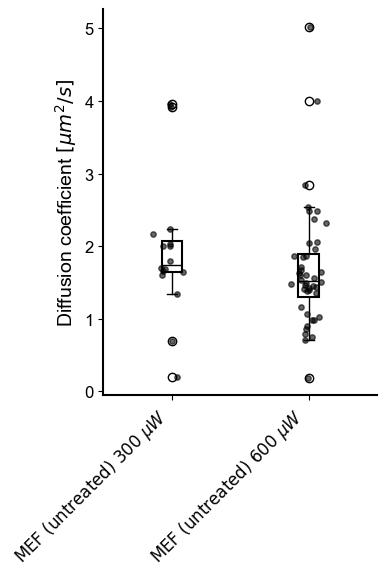

***
$\text{MEF (untreated)}\ 300\ \mu W$
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241018 |                          2 |
+----+--------+----------------------------+
|  1 | 241203 |                          4 |
+----+--------+----------------------------+

Total Independent Cells: 6
***
$\text{MEF (untreated)}\ 600\ \mu W$
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241018 |                          6 |
+----+--------+----------------------------+
|  1 | 241022 |                          5 |
+----+--------+----------------------------+
|  2 | 241023 |                          7 |
+----+--------+----------------------------+
|  3 | 241025 |                          4 |
+----+--------+----------------------------+

Total Independent Cells: 22


In [42]:
plt.close('all')
%matplotlib inline


group_indices = {
    r"$\text{MEF (untreated)}\ 300\ \mu W$": wt_neat_300uW,
    r"$\text{MEF (untreated)}\ 600\ \mu W$": wt_neat_600uW,

}



set_plot_fonts()
plot_boxplot_across_groups(group_indices=group_indices, diffusion_maps=diffusion_maps_thres, center_fraction=CENTRAL_FRACTION, figure_size=(4,6), scatter_colors=['#000000','#000000'], s_scatter=15, is_save=IS_SAVE_PLOT, plot_file_name = "nb017_mef-dii-compare-untreated-laserpower.eps")
plt.rcdefaults()  # Resets to Matplotlib default settings

dict_filenames_of_groups = {group: [list_basename_all[i] for i in indices] for group, indices in group_indices.items()}

for groups, filenames in dict_filenames_of_groups.items():
    print("***")
    print(groups)
    total_cells = tabulate_no_independent_cells(filenames)
    print("\nTotal Independent Cells:", total_cells)

/var/folders/_j/d7rxzvrs6snf8dky44r4_6mr0000gn/T/ipykernel_53724/2782243470.py:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


$\text{MEF (untreated)}$: (44, 96, 96)
$\text{MEF (+ OA)}$: (57, 96, 96)
+----+--------------------------+---------------------+---------------+-------------+---------------+
|    | Group 1                  | Group 2             |   T-statistic |     P-value | Significant   |
+====+==========================+=====================+===============+=============+===============+
|  0 | $\text{MEF (untreated)}$ | $\text{MEF (+ OA)}$ |      -5.34583 | 6.36421e-07 | True          |
+----+--------------------------+---------------------+---------------+-------------+---------------+


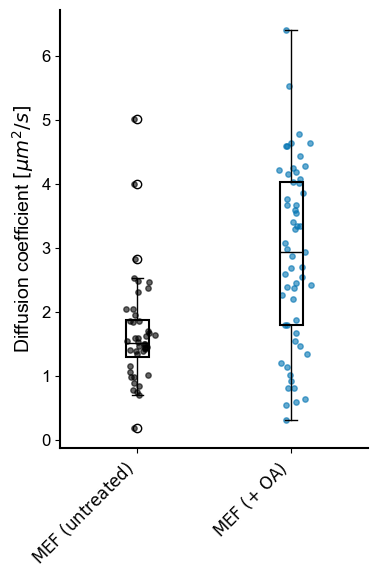

***
$\text{MEF (untreated)}$
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241018 |                          6 |
+----+--------+----------------------------+
|  1 | 241022 |                          5 |
+----+--------+----------------------------+
|  2 | 241023 |                          7 |
+----+--------+----------------------------+
|  3 | 241025 |                          4 |
+----+--------+----------------------------+

Total Independent Cells: 22
***
$\text{MEF (+ OA)}$
+----+--------+----------------------------+
|    |   Date |   Unique Independent Cells |
+====+========+============================+
|  0 | 241018 |                          5 |
+----+--------+----------------------------+
|  1 | 241022 |                          7 |
+----+--------+----------------------------+
|  2 | 241025 |                          4 |
+----+--------+----------------------------+
|  3 | 241203 |   

In [50]:
plt.close('all')
%matplotlib inline



group_indices = {
    r"$\text{MEF (untreated)}$": wt_neat_600uW,
    r"$\text{MEF (+ OA)}$": wt_oa,


}



set_plot_fonts()
plot_boxplot_across_groups(group_indices=group_indices, diffusion_maps=diffusion_maps_thres, center_fraction=CENTRAL_FRACTION, figure_size=(4,6), scatter_colors=['#000000','#0173b2'], s_scatter=15, is_save=IS_SAVE_PLOT, plot_file_name = "nb017_mef-dii-compare-untreated-treated-combined.eps")
plt.rcdefaults()  # Resets to Matplotlib default settings

dict_filenames_of_groups = {group: [list_basename_all[i] for i in indices] for group, indices in group_indices.items()}

for groups, filenames in dict_filenames_of_groups.items():
    print("***")
    print(groups)
    total_cells = tabulate_no_independent_cells(filenames)
    print("\nTotal Independent Cells:", total_cells)

## Save as csv

- extract all filenames and save to .csv
- save all diffusion maps raw, diffusion map thresholded, average intensity
- first column filename, second column and onwards the pixel d values with (row, column index) labelled at first row
- store mean d value of thresholded central region for each group (col 1,2,...) each mean value to be stored row by row. total numnber of row corresponds to the number of cell within the group


In [55]:
l_filename = [i.key for i in all_image_instance.get_list_of_image()]

print(f"total number of files: {len(l_filename)}")


def save_list_to_csv(data, filename):
    with open(filename, mode="w", newline="", encoding="utf-8") as file:
        writer = csv.writer(file)
        for item in data:
            writer.writerow([item])


if IS_SAVE_CSV:
    abs_out_path = os.path.join(
        output_path, "for-article", f"filenames_{len(l_filename)}_total.csv"
    )

    Path(abs_out_path).parent.mkdir(parents=True, exist_ok=True)

    save_list_to_csv(
        l_filename,
        Path(abs_out_path),
    )

total number of files: 136


In [56]:
if IS_SAVE_CSV:
    output_dir = Path(
        os.path.join(output_path, "for-article", "processed_parameter_maps")
    )
    os.makedirs(output_dir, exist_ok=True)

    for i in range(diffusion_maps.shape[0]):
        tifffile.imwrite(
            f"{output_dir}/{l_filename[i]}_DMAP.tif",
            diffusion_maps[i],
            dtype=diffusion_maps[i].dtype,
        )
        tifffile.imwrite(
            f"{output_dir}/{l_filename[i]}_DMAP_THRESHOLDED_{D_THRESHOLD[0]}-{D_THRESHOLD[1]}.tif",
            diffusion_maps_thres[i],
            dtype=diffusion_maps_thres[i].dtype,
        )
        tifffile.imwrite(
            f"{output_dir}/{l_filename[i]}_AVERAGE_INTENSITY.tif",
            array_average_intensity_all[i, 0, :, :],
            dtype=array_average_intensity_all[i].dtype,
        )

In [57]:
def save_d_values_pixel(p_map, list_filename, output_dir, center_fraction=1.0):

    central_regions, ys, xs = get_central_region_multiple_image(
        images=p_map, center_fraction=center_fraction
    )
    num_maps, height, width = central_regions.shape

    print(f"{num_maps=}, {height=}, {width=}, {ys=}, {xs=}")

    # Create a DataFrame with one column named 'filename'
    df = pd.DataFrame(list_filename, columns=["filename"])

    # Generate coordinate labels (x, y) in raster order
    header_coords = [(x, y) for y in range(height) for x in range(width)]
    header_labels = [f"({x + xs},{y + ys})" for (x, y) in header_coords]

    # Flatten each map in row-major (raster) order
    flattened_maps = [map_2d.flatten().tolist() for map_2d in central_regions]

    # Convert to DataFrame and assign headers
    df_pixels = pd.DataFrame(flattened_maps, columns=header_labels)

    # Append pixel data to filename DataFrame
    df = pd.concat([df, df_pixels], axis=1)

    # Save to CSV
    df.to_csv(f"{output_dir}/individual_d_values_cropped_thresholded.csv", index=False)

    return df


if IS_SAVE_CSV:
    df_indiv_pixel = save_d_values_pixel(
        p_map=diffusion_maps_thres,
        list_filename=l_filename,
        output_dir=Path(os.path.join(output_path, "for-article")),
        center_fraction=CENTRAL_FRACTION,
    )
    df_indiv_pixel.head()

num_maps=136, height=48, width=48, ys=24, xs=24


In [58]:
def save_group_mean(
    group_indices: dict, p_maps: np.array, output_dir, center_fraction=1.0
):

    central_regions, _, _ = get_central_region_multiple_image(
        images=p_maps, center_fraction=center_fraction
    )

    # Create dictionary to hold diffusion values in numpy array format
    grouped_arrays = {
        group: central_regions[indices] for group, indices in group_indices.items()
    }

    # Compute averages per cell per group
    group_averages = {}

    for group, arr in grouped_arrays.items():
        print(f"{group}: {arr.shape}")
        n = arr.shape[0]  # Number of elements in first axis
        avg_per_element = [
            np.nanmean(arr[i]) for i in range(n)
        ]  # Generate averages per group
        group_averages[group] = np.array(avg_per_element)  # Store as NumPy array

    # Convert to DataFrame, padding shorter arrays with NaN
    df = pd.DataFrame.from_dict(group_averages, orient="index").transpose()

    df = df.fillna("")

    # Save to CSV
    df.to_csv(f"{output_dir}/grouped_average_values_per_cell.csv", index=False)

    return df


if IS_SAVE_CSV:
    group_indices = {
        r"$\text{MEF (untreated)}$": wt_neat_600uW,
        r"$\text{MEF} (+ OA\ < 1\ \text{hr})$": wt_oa_600uW_lessthan1hour,
        r"$\text{MEF} (+ OA\ 1 - 2\ \text{hr})$": wt_oa_600uW_1to2hour,
        r"$\text{MEF} (+ OA\ 2 - 3\ \text{hr})$": wt_oa_600uW_2to3hour,
        r"$\text{MEF} (+ OA\ >3\ \text{hr})$": wt_oa_600uW_morethan3hour,
    }

    group_means = save_group_mean(
        group_indices=group_indices,
        p_maps=diffusion_maps_thres,
        output_dir=Path(os.path.join(output_path, "for-article")),
        center_fraction=CENTRAL_FRACTION,
    )

    group_means.head()

$\text{MEF (untreated)}$: (44, 48, 48)
$\text{MEF} (+ OA\ < 1\ \text{hr})$: (10, 48, 48)
$\text{MEF} (+ OA\ 1 - 2\ \text{hr})$: (13, 48, 48)
$\text{MEF} (+ OA\ 2 - 3\ \text{hr})$: (22, 48, 48)
$\text{MEF} (+ OA\ >3\ \text{hr})$: (12, 48, 48)
